In [1]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import requests
import seaborn as sns
import matplotlib.pyplot as plt
from time import time
import random
import time
from bs4 import BeautifulSoup
import urllib
import re
import json
from datetime import datetime, date, timedelta
from datetime import datetime as dt

# Import the libraries for Selenium WebDriver
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException
from selenium.common.exceptions import ElementClickInterceptedException
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.action_chains import ActionChains
import warnings
warnings.filterwarnings('ignore') # Ignore all warnings
pd.options.display.max_rows = 5000

# Import the NLTK libraries
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# Import the Word Cloud Library
from wordcloud import WordCloud

# Import sklearn libraries
from sklearn.model_selection import train_test_split,  cross_val_score, cross_val_predict, StratifiedKFold, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier

D:\anacondanew\lib\site-packages\requests\__init__.py:89: RequestsDependencyWarning: urllib3 (2.1.0) or chardet (3.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [101]:
# Check the current version of Python in use
!python --version

Python 3.8.5


# Data Extraction

### --> 1. Extract Premier-League-Stats (2019-2023) for the past 4 Seasons 

In [2]:
# Function to extract data from a given URL
def extract_data(url):
    try:
        # Send a GET request to the URL
        response = requests.get(url)

        # Raise an exception for non-200 status codes
        response.raise_for_status()

        # Parse the HTML content of the page
        soup = BeautifulSoup(response.content, 'html.parser')

        # Find the table containing the data
        table = soup.find('table', {'class': 'stats_table'})

        # Extract column headers
        headers = [th.text.strip() for th in table.select('thead th')]

        # Extract data rows
        data_rows = []
        for row in table.select('tbody tr'):
            data_rows.append([td.text.strip() for td in row.select('td')])

        # Create a DataFrame for the current season
        df = pd.DataFrame(data_rows)

        # Introduce a sleep timer of 15 seconds
        time.sleep(15)

        return df

    except requests.exceptions.HTTPError as errh:
        print(f"HTTP Error: {errh}")  # Error Handling for HTTP requests
    except requests.exceptions.ConnectionError as errc:
        print(f"Error Connecting: {errc}")  # Error Handling for Connection requests
    except requests.exceptions.Timeout as errt:
        print(f"Timeout Error: {errt}")     # Error Handling for Timeout requests
    except requests.exceptions.RequestException as err:
        print(f"An error occurred: {err}")  
    return None

# List of URLs for each season
season_urls = [
    "https://fbref.com/en/comps/9/2022-2023/2022-2023-Premier-League-Stats", # 2022-2023
    "https://fbref.com/en/comps/9/2021-2022/2021-2022-Premier-League-Stats", # 2021-2022
    "https://fbref.com/en/comps/9/2020-2021/2020-2021-Premier-League-Stats", # 2020-2021
    "https://fbref.com/en/comps/9/2019-2020/2019-2020-Premier-League-Stats", # 2019-2020
]

# Initialize an empty DataFrame to store the combined data
combined_df = pd.DataFrame()

# Loop through each season URL and extract data
for url in season_urls:
    print(f"Extracting data for  {url}...")
    season_df = extract_data(url)

    # Append the current season data to the combined DataFrame
    if season_df is not None:
        combined_df = pd.concat([combined_df, season_df], ignore_index=True)

Extracting data for  https://fbref.com/en/comps/9/2022-2023/2022-2023-Premier-League-Stats...
Extracting data for  https://fbref.com/en/comps/9/2021-2022/2021-2022-Premier-League-Stats...
Extracting data for  https://fbref.com/en/comps/9/2020-2021/2020-2021-Premier-League-Stats...
Extracting data for  https://fbref.com/en/comps/9/2019-2020/2019-2020-Premier-League-Stats...


In [3]:
# Display the combined DataFrame
display(combined_df)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Manchester City,38,28,5,5,94,33,+61,89,2.34,78.6,32.1,+46.5,+1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,+45,84,2.21,71.9,42.0,+29.9,+0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester Utd,38,23,6,9,58,43,+15,75,1.97,67.7,50.4,+17.3,+0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle Utd,38,19,14,5,68,33,+35,71,1.87,72.0,39.6,+32.4,+0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,+28,67,1.76,72.6,50.9,+21.7,+0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish
5,Brighton,38,18,8,12,72,53,+19,62,1.63,73.3,50.2,+23.1,+0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish
6,Aston Villa,38,18,7,13,51,46,+5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish
7,Tottenham,38,18,6,14,70,63,+7,60,1.58,57.1,49.7,+7.4,+0.20,"61,585",Harry Kane - 30,Hugo Lloris,
8,Brentford,38,15,14,9,58,46,+12,59,1.55,56.8,49.9,+6.8,+0.18,"17,078",Ivan Toney - 20,David Raya,
9,Fulham,38,15,7,16,55,53,+2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,


In [4]:
five_seaons_results = combined_df
five_seaons_results.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Manchester City,38,28,5,5,94,33,+61,89,2.34,78.6,32.1,+46.5,+1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,+45,84,2.21,71.9,42.0,+29.9,+0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester Utd,38,23,6,9,58,43,+15,75,1.97,67.7,50.4,+17.3,+0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle Utd,38,19,14,5,68,33,+35,71,1.87,72.0,39.6,+32.4,+0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,+28,67,1.76,72.6,50.9,+21.7,+0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish


In [5]:
# Initialize new column names
column_names = [ 'Squad', 'MP', 'W', 'D', 'L', 'GF', 'GA', 'GD', 'Pts', 'Pts/MP', 'xG', 'xGA', 'xGD', 'xGD/90', 'Attendance', 'Top Team Scorer', 'Goalkeeper', 'Notes']

# Assigning column names
five_seaons_results.columns = column_names

In [6]:
five_seaons_results

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes
0,Manchester City,38,28,5,5,94,33,+61,89,2.34,78.6,32.1,+46.5,+1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,+45,84,2.21,71.9,42.0,+29.9,+0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester Utd,38,23,6,9,58,43,+15,75,1.97,67.7,50.4,+17.3,+0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle Utd,38,19,14,5,68,33,+35,71,1.87,72.0,39.6,+32.4,+0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,+28,67,1.76,72.6,50.9,+21.7,+0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish
5,Brighton,38,18,8,12,72,53,+19,62,1.63,73.3,50.2,+23.1,+0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish
6,Aston Villa,38,18,7,13,51,46,+5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish
7,Tottenham,38,18,6,14,70,63,+7,60,1.58,57.1,49.7,+7.4,+0.20,"61,585",Harry Kane - 30,Hugo Lloris,
8,Brentford,38,15,14,9,58,46,+12,59,1.55,56.8,49.9,+6.8,+0.18,"17,078",Ivan Toney - 20,David Raya,
9,Fulham,38,15,7,16,55,53,+2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,


#### Save and Load the file

In [7]:
# Save the file
#five_seaons_results.to_csv('epl_standings_2018_2023.csv', index=False)

# Load the file
five_seaons_results = pd.read_csv('epl_standings_2018_2023.csv')
#five_seaons_results

-------------------------------------------------------

### ---> 2. Extract the Last 5 seaons (2018-2023) 'Scores & Fixtures'

In [8]:
# Function to extract last 5 seasons Scores & Fixtures
def extract_scores_and_fixtures_data(url):
    try:
        # Send a GET request to the URL
        response = requests.get(url)

        # Raise an exception for non-200 status codes
        response.raise_for_status()

        # Parse the HTML content of the page
        soup = BeautifulSoup(response.content, 'html.parser')

        # Find the table containing the data
        table = soup.find('table', {'class': 'stats_table'})

        # Extract column headers
        headers_2 = [th.text.strip() for th in table.select('thead th')]

        # Extract data rows
        data_rows = []
        for row in table.select('tbody tr'):
            data_rows.append([td.text.strip() for td in row.select('td')])

        # Create a DataFrame for the current season
        scores_and_fixtures_df = pd.DataFrame(data_rows)

        # Introduce a sleep timer of 15 seconds
        time.sleep(15)

        return scores_and_fixtures_df

    except requests.exceptions.HTTPError as errh:
        print(f"HTTP Error: {errh}")   # Error Handling for HTTP requests
    except requests.exceptions.ConnectionError as errc:
        print(f"Error Connecting: {errc}")   # Error Handling for Connection requests
    except requests.exceptions.Timeout as errt:
        print(f"Timeout Error: {errt}")   # Error Handling for Timeout requests
    except requests.exceptions.RequestException as err:
        print(f"An error occurred: {err}")
    return None

# List of URLs for each season
seasons = ["2022-2023", "2021-2022", "2020-2021", "2019-2020"]

# Initialize an empty DataFrame to store the combined data
combined_df_2 = pd.DataFrame()

# Loop through each season and extract data
for season in seasons:
    url = f"https://fbref.com/en/comps/9/{season}/schedule/Premier-League-Scores-and-Fixtures"
    print(f"Extracting data for {season}...")
    season_df = extract_scores_and_fixtures_data(url)

    # Append the current season data to the combined DataFrame
    if season_df is not None:
        combined_df_2 = pd.concat([combined_df_2, season_df], ignore_index=True)

Extracting data for 2022-2023...
Extracting data for 2021-2022...
Extracting data for 2020-2021...
Extracting data for 2019-2020...


In [9]:
scores_and_fixtures_df_2 = combined_df_2

# Set column names
column_names_scores_fixtures = ['Day','Date','Time','Home','xG','Score','xG','Away','Attendance','Venue','Referee','Match_Report','Notes']

# Assigning column names
scores_and_fixtures_df_2.columns = column_names_scores_fixtures

In [10]:
display(scores_and_fixtures_df_2)

,Day,Date,Time,Home,xG,Score,xG,Away,Attendance,Venue,Referee,Match_Report,Notes
0,Fri,2022-08-05,20:00,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor,Match Report,
1,Sat,2022-08-06,12:30,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley,Match Report,
2,Sat,2022-08-06,15:00,Tottenham,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner,Match Report,
3,Sat,2022-08-06,15:00,Newcastle Utd,1.7,2–0,0.3,Nott'ham Forest,"52,245",St James' Park,Simon Hooper,Match Report,
4,Sat,2022-08-06,15:00,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones,Match Report,
5,Sat,2022-08-06,15:00,Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes,Match Report,
6,Sat,2022-08-06,17:30,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson,Match Report,
7,Sun,2022-08-07,14:00,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett,Match Report,
8,Sun,2022-08-07,14:00,Manchester Utd,1.4,1–2,1.5,Brighton,"73,711",Old Trafford,Paul Tierney,Match Report,
9,Sun,2022-08-07,16:30,West Ham,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver,Match Report,


#### Save and Load the File

In [11]:
# Save the File
#scores_and_fixtures_df_2.to_csv('epl_scores_and_fixtures_2018_2023.csv', index=False)

# Load the file
scores_and_fixtures = pd.read_csv('epl_scores_and_fixtures_2018_2023.csv')
#display(scores_and_fixtures)

-----------------------

### Data Wrangling on each dataset for building the corpus

#### 1. EPL Statndings dataset

In [12]:
# 1. EPL Stats Data
pl_stats = pd.read_csv('epl_standings_2018_2023.csv')
display(pl_stats)

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester Utd,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle Utd,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish
5,Brighton,38,18,8,12,72,53,19,62,1.63,73.3,50.2,23.1,0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish
6,Aston Villa,38,18,7,13,51,46,5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish
7,Tottenham,38,18,6,14,70,63,7,60,1.58,57.1,49.7,7.4,0.20,"61,585",Harry Kane - 30,Hugo Lloris,NaN
8,Brentford,38,15,14,9,58,46,12,59,1.55,56.8,49.9,6.8,0.18,"17,078",Ivan Toney - 20,David Raya,NaN
9,Fulham,38,15,7,16,55,53,2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,NaN


In [13]:
# Map the teams to their full names ( Original Names) for better consistency in further analysis
team_mapping_pl_stats = { 'Arsenal': 'Arsenal',
 'Aston Villa': 'Aston Villa',
 'Bournemouth': 'AFC Bournemouth',
 'Brentford': 'Brentford',
 'Brighton': 'Brighton & Hove Albion',
 'Burnley': 'Burnley',
 'Chelsea': 'Chelsea',
 'Crystal Palace' : 'Crystal Palace',
 'Everton': 'Everton',
 'Fulham': 'Fulham',
 'Leeds United' : 'Leeds United',
 'Leicester City' : 'Leicester City',
 'Liverpool': 'Liverpool',
 'Manchester City': 'Manchester City',
 #'Man United': 'Manchester United',
 'Manchester Utd':'Manchester United',             
 'Manchester United':'Manchester United', # Duplicate
 'Newcastle Utd': 'Newcastle Utd', # Duplicate
 'Newcastle Utd': 'Newcastle United',
 'Norwich': 'Norwich City' ,
 "Nott'ham Forest" : 'Nottingham Forest',
 'Sheffield Utd' : 'Sheffield United',
 'Southampton': 'Southampton',
 'Tottenham' : 'Tottenham Hotspur',
 'Watford' : 'Watford',
 'West Brom' : 'West Bromwich Albion',
 'West Ham': 'West Ham United',
 'Wolves': 'Wolves'
               }

pl_stats['Squad'] = pl_stats['Squad'].replace(team_mapping_pl_stats)

# Display the modified DataFrame
display(pl_stats)

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester United,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle United,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish
5,Brighton & Hove Albion,38,18,8,12,72,53,19,62,1.63,73.3,50.2,23.1,0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish
6,Aston Villa,38,18,7,13,51,46,5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish
7,Tottenham Hotspur,38,18,6,14,70,63,7,60,1.58,57.1,49.7,7.4,0.20,"61,585",Harry Kane - 30,Hugo Lloris,NaN
8,Brentford,38,15,14,9,58,46,12,59,1.55,56.8,49.9,6.8,0.18,"17,078",Ivan Toney - 20,David Raya,NaN
9,Fulham,38,15,7,16,55,53,2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,NaN


In [14]:
# Create a 'Year' column based on the specified conditions
pl_stats['Year'] = '2022/2023'  # Default value for all rows
pl_stats.loc[0:19, 'Year'] = '2022/2023'
pl_stats.loc[20:39, 'Year'] = '2021/2022'
pl_stats.loc[40:59, 'Year'] = '2020/2021'
pl_stats.loc[60:80, 'Year'] = '2019/2020'

# Display the updated DataFrame
display(pl_stats.head())

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes,Year
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish,2022/2023
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish,2022/2023
2,Manchester United,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish,2022/2023
3,Newcastle United,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish,2022/2023
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish,2022/2023


---------------------------------------------------------------------

#### 2. EPL Scores & Fixtures datset

In [15]:
# Clean the  'Scores & Fixtures' files
pl_scores_and_fixtures = pd.read_csv('epl_scores_and_fixtures_2018_2023.csv')
display(pl_scores_and_fixtures.head(15))

,Day,Date,Time,Home,xG,Score,xG.1,Away,Attendance,Venue,Referee,Match_Report,Notes
0,Fri,2022-08-05,20:00,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor,Match Report,NaN
1,Sat,2022-08-06,12:30,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley,Match Report,NaN
2,Sat,2022-08-06,15:00,Tottenham,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner,Match Report,NaN
3,Sat,2022-08-06,15:00,Newcastle Utd,1.7,2–0,0.3,Nott'ham Forest,"52,245",St James' Park,Simon Hooper,Match Report,NaN
4,Sat,2022-08-06,15:00,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones,Match Report,NaN
5,Sat,2022-08-06,15:00,Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes,Match Report,NaN
6,Sat,2022-08-06,17:30,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson,Match Report,NaN
7,Sun,2022-08-07,14:00,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett,Match Report,NaN
8,Sun,2022-08-07,14:00,Manchester Utd,1.4,1–2,1.5,Brighton,"73,711",Old Trafford,Paul Tierney,Match Report,NaN
9,Sun,2022-08-07,16:30,West Ham,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver,Match Report,NaN


In [16]:
# Check for missing values
print(f" Number of Missing Values: " ,    pl_scores_and_fixtures.isna().sum())

 Number of Missing Values:  Day              217
Date             217
Time             217
Home             217
xG               217
Score            217
xG.1             217
Away             217
Attendance       658
Venue            217
Referee          217
Match_Report     217
Notes           1737
dtype: int64


In [17]:
# Remove all rows with missing values and the columns 'Match Report' and 'Notes' with missing values
pl_scores_and_fixtures_new = pl_scores_and_fixtures.drop(['Match_Report','Notes'],axis = 1) # Drop the Notes column
pl_scores_and_fixtures_new.head(15)

# -----------------------------------------------------------------------------------------------------------------#

# Drop all ROWS with no data
pl_scores_and_fixtures_new = pl_scores_and_fixtures_new.dropna(how = 'all')
pl_scores_and_fixtures_new.head(15)

,Day,Date,Time,Home,xG,Score,xG.1,Away,Attendance,Venue,Referee
0,Fri,2022-08-05,20:00,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor
1,Sat,2022-08-06,12:30,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley
2,Sat,2022-08-06,15:00,Tottenham,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner
3,Sat,2022-08-06,15:00,Newcastle Utd,1.7,2–0,0.3,Nott'ham Forest,"52,245",St James' Park,Simon Hooper
4,Sat,2022-08-06,15:00,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones
5,Sat,2022-08-06,15:00,Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes
6,Sat,2022-08-06,17:30,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson
7,Sun,2022-08-07,14:00,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett
8,Sun,2022-08-07,14:00,Manchester Utd,1.4,1–2,1.5,Brighton,"73,711",Old Trafford,Paul Tierney
9,Sun,2022-08-07,16:30,West Ham,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver


In [18]:
# Rename Column names: 
# 'xG' --> Expected_Goals_Home_Team
# 'xG.1' --> Expected_Goals_Away_Team

pl_scores_and_fixtures_new = pl_scores_and_fixtures_new.rename(columns = {'xG' : 'Expected_Goals_Home_Team',
                                                                          'xG.1' : 'Expected_Goals_Away_Team'})
pl_scores_and_fixtures_new.head()

,Day,Date,Time,Home,Expected_Goals_Home_Team,Score,Expected_Goals_Away_Team,Away,Attendance,Venue,Referee
0,Fri,2022-08-05,20:00,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor
1,Sat,2022-08-06,12:30,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley
2,Sat,2022-08-06,15:00,Tottenham,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner
3,Sat,2022-08-06,15:00,Newcastle Utd,1.7,2–0,0.3,Nott'ham Forest,"52,245",St James' Park,Simon Hooper
4,Sat,2022-08-06,15:00,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones


In [19]:
# Convert 'Date' column to datetime format and extract the year
pl_scores_and_fixtures_new['Year'] = pd.to_datetime(pl_scores_and_fixtures_new['Date']).dt.year

# Create a mapping dictionary for the Season column
season_mapping = {
    2020: '2019/2020',
    2021: '2020/2021',
    2022: '2021/2022',
    2023: '2022/2023',
}

# Create the 'Season' column
pl_scores_and_fixtures_new['Season'] = pl_scores_and_fixtures_new['Year'].map(season_mapping)

# Drop the 'Day', 'Date', 'Time', and 'Year' columns
columns_to_drop = ['Day', 'Date', 'Time', 'Year']
pl_scores_and_fixtures_new = pl_scores_and_fixtures_new.drop(columns=columns_to_drop, axis=1)

# Rename the 'Season' column to 'Year'
pl_scores_and_fixtures_new = pl_scores_and_fixtures_new.rename(columns={'Season': 'Year'})

# Display the updated DataFrame
display(pl_scores_and_fixtures_new)

,Home,Expected_Goals_Home_Team,Score,Expected_Goals_Away_Team,Away,Attendance,Venue,Referee,Year
0,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor,2021/2022
1,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley,2021/2022
2,Tottenham,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner,2021/2022
3,Newcastle Utd,1.7,2–0,0.3,Nott'ham Forest,"52,245",St James' Park,Simon Hooper,2021/2022
4,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones,2021/2022
5,Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes,2021/2022
6,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson,2021/2022
7,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett,2021/2022
8,Manchester Utd,1.4,1–2,1.5,Brighton,"73,711",Old Trafford,Paul Tierney,2021/2022
9,West Ham,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver,2021/2022


In [20]:
sorted(pl_scores_and_fixtures_new['Home'].unique())

['Arsenal',
 'Aston Villa',
 'Bournemouth',
 'Brentford',
 'Brighton',
 'Burnley',
 'Chelsea',
 'Crystal Palace',
 'Everton',
 'Fulham',
 'Leeds United',
 'Leicester City',
 'Liverpool',
 'Manchester City',
 'Manchester Utd',
 'Newcastle Utd',
 'Norwich City',
 "Nott'ham Forest",
 'Sheffield Utd',
 'Southampton',
 'Tottenham',
 'Watford',
 'West Brom',
 'West Ham',
 'Wolves']

In [21]:
team_mapping = { 'Arsenal': 'Arsenal',
 'Aston Villa': 'Aston Villa',
 'Bournemouth': 'AFC Bournemouth',
 'Brentford': 'Brentford',
 'Brighton': 'Brighton & Hove Albion',
 'Burnley': 'Burnley',
 'Chelsea': 'Chelsea',
 'Crystal Palace' : 'Crystal Palace',
 'Everton': 'Everton',
 'Fulham': 'Fulham',
 'Leeds United' : 'Leeds United',
 'Leicester City' : 'Leicester City',
 'Liverpool': 'Liverpool',
 'Manchester City': 'Manchester City',
 #'Man United': 'Manchester United',
 'Manchester Utd':'Manchester United',             
 'Manchester United':'Manchester United', # Duplicate
 'Newcastle Utd': 'Newcastle Utd', # Duplicate
 'Newcastle Utd': 'Newcastle United',
 'Norwich': 'Norwich City' ,
 "Nott'ham Forest" : 'Nottingham Forest',
 'Sheffield Utd' : 'Sheffield United',
 'Southampton': 'Southampton',
 'Tottenham' : 'Tottenham Hotspur',
 'Watford' : 'Watford',
 'West Brom' : 'West Bromwich Albion',
 'West Ham': 'West Ham United',
 'Wolves': 'Wolves'
               }

pl_scores_and_fixtures_new['Home'] = pl_scores_and_fixtures_new['Home'].replace(team_mapping)
pl_scores_and_fixtures_new['Away'] = pl_scores_and_fixtures_new['Away'].replace(team_mapping)

# Display the modified DataFrame
display(pl_scores_and_fixtures_new)

,Home,Expected_Goals_Home_Team,Score,Expected_Goals_Away_Team,Away,Attendance,Venue,Referee,Year
0,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor,2021/2022
1,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley,2021/2022
2,Tottenham Hotspur,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner,2021/2022
3,Newcastle United,1.7,2–0,0.3,Nottingham Forest,"52,245",St James' Park,Simon Hooper,2021/2022
4,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones,2021/2022
5,AFC Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes,2021/2022
6,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson,2021/2022
7,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett,2021/2022
8,Manchester United,1.4,1–2,1.5,Brighton & Hove Albion,"73,711",Old Trafford,Paul Tierney,2021/2022
9,West Ham United,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver,2021/2022


 ### --> 3. Extract Referee Statistics Data

In [22]:
# Function to Scrape Referee Statistics
def scrape_referee_table(url):
    try:
        # Send a GET request to the URL
        response = requests.get(url)

        # Raise an exception for non-200 status codes
        response.raise_for_status()

        # Introduce a delay of 15 seconds
        time.sleep(15)

        # Parse the HTML content of the page
        soup = BeautifulSoup(response.content, 'html.parser')

        # Find the table containing the referee data
        table = soup.find('table', {'class': 'table referee'})

        # Check if the table exists
        if table:
            # Extract column headers
            headers = [th.text.strip() for th in table.select('thead th')]

            # Extract data rows
            data_rows = []
            for row in table.select('tbody tr'):
                data_rows.append([td.text.strip() for td in row.select('td')])

            # Create a DataFrame for the referee data
            referee_df = pd.DataFrame(data_rows, columns=headers)

            return referee_df

        else:
            print(f"Table not found on the page: {url}")
            return None

    except requests.exceptions.HTTPError as errh:
        print(f"HTTP Error: {errh}")  # Error Handling for HTTP requests
        return None
    except requests.exceptions.ConnectionError as errc:
        print(f"Error Connecting: {errc}") # Error Handling for Connection requests
        return None
    except requests.exceptions.Timeout as errt:
        print(f"Timeout Error: {errt}")  # Error Handling for Timeout requests
        return None
    except requests.exceptions.RequestException as err:
        print(f"An error occurred: {err}")
        return None

# URLs for the seasons
urls = [
    'https://www.soccerbase.com/referees/home.sd?tourn_id=1635',  # 2018/19
    'https://www.soccerbase.com/referees/home.sd?tourn_id=1710',  # 2019/20
    'https://www.soccerbase.com/referees/home.sd?tourn_id=1797',  # 2020/21
    'https://www.soccerbase.com/referees/home.sd?tourn_id=1848',  # 2021/22
    'https://www.soccerbase.com/referees/home.sd?tourn_id=1944'   # 2022/23
]

# List to store dataframes for each season
season_data = []

# Scrape data for each season and append the DataFrame to the list
for url in urls:
    print(f"\nScraping data for {url}...")
    season_df = scrape_referee_table(url)

    # Append the resulting DataFrame for each season to the list
    if season_df is not None:
        season_data.append(season_df)
        print(season_df.to_string(index=False))


Scraping data for https://www.soccerbase.com/referees/home.sd?tourn_id=1635...
            NAME             FROM GAMES 2018/19 YELLOW CARDS RED CARDS
 Martin Atkinson   West Yorkshire            29           91         1
  Stuart Attwell     Warwickshire            20           63         1
     David Coote  Nottinghamshire            11           35         0
       Mike Dean           Wirral            29          134        10
      Roger East        Wiltshire            10           44         0
    Kevin Friend   Leicestershire            27           92         3
    Simon Hooper        Wiltshire             8           20         0
  Chris Kavanagh       Lancashire            24           75         2
     Andy Madley   West Yorkshire             2            2         0
  Andre Marriner    West Midlands            27           76         3
       Lee Mason       Lancashire            19           63         1
   Jonathan Moss   West Yorkshire            27           97        

In [23]:
# Concatenate the dataframes for each season into a single dataframe
result = pd.concat(season_data, ignore_index=True)

# Aggregate the Referee Statistics
result.columns = result.columns.str.replace(' ', '_')
numeric_columns = ['GAMES_2018/19', 'GAMES_2019/20', 'GAMES_2020/21', 'GAMES_2021/22', 'GAMES_2022/23', 'YELLOW_CARDS', 'RED_CARDS']
result[numeric_columns] = result[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Group by referee name and place of origin, and aggregate total games, yellow cards, and red cards
referee_summary = result.groupby(['NAME', 'FROM']).agg({
    'GAMES_2018/19': 'sum',
    'GAMES_2019/20': 'sum',
    'GAMES_2020/21': 'sum',
    'GAMES_2021/22': 'sum',
    'GAMES_2022/23': 'sum',
    'YELLOW_CARDS': 'sum',
    'RED_CARDS': 'sum'
}).reset_index()

# Create the 'Total_Games' column
referee_summary['Total_Games_Officiated_by_Referee'] = referee_summary[['GAMES_2018/19', 'GAMES_2019/20', 'GAMES_2020/21', 'GAMES_2021/22', 'GAMES_2022/23']].sum(axis=1)

# Select only the desired columns and rename them
referee_summary = referee_summary[['NAME', 'FROM', 'YELLOW_CARDS', 'RED_CARDS', 'Total_Games_Officiated_by_Referee']]
referee_summary = referee_summary.rename(columns={
    'NAME': 'Referee',
    'FROM': 'Referee_Origin',
    'YELLOW_CARDS': 'Total_Yellow_Cards_by_Referee',
    'RED_CARDS': 'Total_Red_Cards_by_Referee',
    'Total_Games_Officiated_by_Referee': 'Total_Games_Officiated_by_Referee'
})

# Display the final result
display(referee_summary)

,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,Andre Marriner,West Midlands,305,10,108.0
1,Andy Madley,West Yorkshire,207,7,69.0
2,Anthony Taylor,Cheshire,518,18,150.0
3,Chris Kavanagh,Lancashire,333,8,103.0
4,Craig Pawson,South Yorkshire,447,15,119.0
5,Darren Bond,Lancashire,17,1,4.0
6,Darren England,Doncaster,162,3,45.0
7,David Coote,Nottinghamshire,324,10,89.0
8,Graham Scott,Oxfordshire,182,13,67.0
9,Jarred Gillett,Australia,79,2,26.0


In [24]:
# Sort the DataFrame by total yellow cards and red cards in descending order
referee_summary_sorted = referee_summary.sort_values(by=['Total_Yellow_Cards_by_Referee', 'Total_Red_Cards_by_Referee','Total_Games_Officiated_by_Referee'], ascending=False)

# Reset the index
referee_summary_sorted = referee_summary_sorted.reset_index(drop=True)

# Display the sorted result
display(referee_summary_sorted)

,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,Anthony Taylor,Cheshire,518,18,150.0
1,Paul Tierney,Lancashire,461,14,127.0
2,Craig Pawson,South Yorkshire,447,15,119.0
3,Michael Oliver,Northumberland,440,18,146.0
4,Mike Dean,Wirral,426,24,107.0
5,Stuart Attwell,Warwickshire,396,12,109.0
6,Chris Kavanagh,Lancashire,333,8,103.0
7,David Coote,Nottinghamshire,324,10,89.0
8,Jonathan Moss,West Yorkshire,318,13,102.0
9,Martin Atkinson,West Yorkshire,311,10,113.0


In [111]:
# Save the File
#referee_summary.to_csv('epl_referee_statistics_2018_2023.csv', index=False)

# Load the file
referee_stats = pd.read_csv('epl_referee_statistics_2018_2023.csv')
#display(referee_stats)

In [115]:
referee_stats['Referee'].nunique()

31

---------------------------------------------------------

------------------------------------------------------------------------------------

# Using SELENIUM WEB DRIVER to extract Video Assistant Referee stats

### --> Get VAR (Video Assistant Referee) Incident Data for seasons 2019 to 2023.

In [26]:
# Gather the relevant URL's for each season
var_details_2019_2020 = 'https://www.espn.com/soccer/english-premier-league/story/3929823/how-var-decisions-have-affected-every-premier-league-club'
var_details_2020_2021 = 'https://www.espn.com.sg/football/english-premier-league/story/4182135/how-var-decisions-affected-every-premier-league-club-in-2020-21'
var_details_2021_2022 = 'https://www.espn.com.au/football/story/_/id/37619801/how-var-decisions-affected-every-premier-league-club-2021-22'
var_details_2022_2023 = 'https://www.espn.com.au/football/story/_/id/37631044/how-var-decisions-affected-every-premier-league-club-2022-23'


# Set wait times for Selenium
waittime = 30 # set a wait time for scraping the data
sleeptime = 0.5 # set a sleep timer for scraping the data

# Initiate web driver
try:
    driver.close() # Close any existing WebDrivers
except Exception:
    pass

# Set webdriver options
options = webdriver.ChromeOptions()
options.add_argument('--no-sandbox')
options.add_argument('ignore-certificate-errors')

# Initiate webdriver
driver = webdriver.Chrome(options=options) 

### --> Get VAR Incidents for 2019/20 season

In [27]:
# Direct driver to 2019/2020 page
driver.get(var_details_2019_2020)

# Team numbering
team_list_elems = driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/h2") + \
                    driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/video2/h2")
team_title_list = []
team_list = []

for team in team_list_elems:
    team_title_list.append(team.text)
    team_list.append(team.text.rsplit(' ',1)[0])

incident_list = []
inc_list = team_title_list + ['Game', 'Incident']
exc_list = ['Overturns:']

parent = driver.find_element(By.XPATH, "//div[@class='article-body']/video1")

all_children_elements = parent.find_elements(By.XPATH,'./child::*') + \
                        parent.find_elements(By.XPATH,'./video2/child::*')

for child in all_children_elements:
    if any(keyword in child.text for keyword in inc_list) and not any(keyword in child.text for keyword in exc_list):
        incident_list.append(child.text)
team_name = ''
incident_list_organized_1920 = []

for line in incident_list[1:]:
    global team_name
    for name in team_list:
        if line.startswith(name):
            team_name = name
            continue
    if line.startswith('Game'):
        incident_list_organized_1920.append([team_name, line])

In [28]:
incident_df_2019_20 = pd.DataFrame.from_records(incident_list_organized_1920, columns=['team', 'match_info_full'])
incident_df_2019_20['year'] = '2019/2020'
incident_df_2019_20

,team,match_info_full,year
0,Brighton & Hove Albion,Game: West Ham (H; Aug. 17)\nIncident: Brighto...,2019/2020
1,Brighton & Hove Albion,Game: Aston Villa (A; Oct. 19)\nIncident: Cono...,2019/2020
2,Brighton & Hove Albion,Game: Everton (H; Oct. 26)\nIncident: Penalty ...,2019/2020
3,Brighton & Hove Albion,Game: Leicester (H; Nov. 23)\nIncident: Jamie ...,2019/2020
4,Brighton & Hove Albion,Game: Arsenal (A; Dec. 5)\nIncident: David Lui...,2019/2020
5,Brighton & Hove Albion,Game: Sheffield United (H; Dec. 21)\nIncident:...,2019/2020
6,Brighton & Hove Albion,Game: Tottenham (A; Dec. 26)\nIncident: Harry ...,2019/2020
7,Brighton & Hove Albion,Game: Bournemouth (H; Dec. 28)\nIncident: Dan ...,2019/2020
8,Brighton & Hove Albion,Game: Everton (A; Jan. 11)\nIncident: Goal for...,2019/2020
9,Brighton & Hove Albion,Game: West Ham (A; Feb. 1)\nIncident: Goal for...,2019/2020


### --> Get VAR incidents for 2020/21 season

In [210]:
# Direct driver to 2019/2020 page
driver.get(VAR_PAGE_2020_2021)

# Team numbering
team_list_elems = driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/h2") + \
                    driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/video2/h2")  # Extract the data using XPATH
team_title_list = []
team_list = []

for team in team_list_elems:
    team_title_list.append(team.text)
    team_list.append(team.text.rsplit(' ',1)[0])

incident_list = []   # Create an empty list
inc_list = team_title_list + ['Game', 'Incident']
exc_list = ['Overturns:']

parent = driver.find_element(By.XPATH, "//div[@class='article-body']/video1")  # Search the Parent element by Xpath

all_children_elements = parent.find_elements(By.XPATH,'./child::*') + \
                        parent.find_elements(By.XPATH,'./video2/child::*')  # Search the Child element 

for child in all_children_elements:
    if any(keyword in child.text for keyword in inc_list) and not any(keyword in child.text for keyword in exc_list):
        incident_list.append(child.text)
team_name = ''
incident_list_organized_20_21 = []

for line in incident_list[1:]:
    global team_name
    for name in team_list:
        if line.startswith(name):
            team_name = name
            continue
    if line.startswith('Game'):
        incident_list_organized_20_21.append([team_name, line])

In [28]:
incident_df_2019_20 = pd.DataFrame.from_records(incident_list_organized_1920, columns=['team', 'match_info_full'])
incident_df_2019_20['year'] = '2019/2020'
incident_df_2019_20

,team,match_info_full,year
0,Brighton & Hove Albion,Game: West Ham (H; Aug. 17)\nIncident: Brighto...,2019/2020
1,Brighton & Hove Albion,Game: Aston Villa (A; Oct. 19)\nIncident: Cono...,2019/2020
2,Brighton & Hove Albion,Game: Everton (H; Oct. 26)\nIncident: Penalty ...,2019/2020
3,Brighton & Hove Albion,Game: Leicester (H; Nov. 23)\nIncident: Jamie ...,2019/2020
4,Brighton & Hove Albion,Game: Arsenal (A; Dec. 5)\nIncident: David Lui...,2019/2020
5,Brighton & Hove Albion,Game: Sheffield United (H; Dec. 21)\nIncident:...,2019/2020
6,Brighton & Hove Albion,Game: Tottenham (A; Dec. 26)\nIncident: Harry ...,2019/2020
7,Brighton & Hove Albion,Game: Bournemouth (H; Dec. 28)\nIncident: Dan ...,2019/2020
8,Brighton & Hove Albion,Game: Everton (A; Jan. 11)\nIncident: Goal for...,2019/2020
9,Brighton & Hove Albion,Game: West Ham (A; Feb. 1)\nIncident: Goal for...,2019/2020


In [29]:
# Direct driver to 2019/2020 page
driver.get(var_details_2020_2021)

# Team numbering
team_list_elems = driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/h2") + \
                    driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/video2/h2") # Extract the data using XPATH
team_title_list = []
team_list = []

for team in team_list_elems:
    team_title_list.append(team.text)
    team_list.append(team.text.rsplit(' ',1)[0])

incident_list = []
inc_list = team_title_list + ['Game', 'Incident']
exc_list = ['Overturns:']

parent = driver.find_element(By.XPATH, "//div[@class='article-body']/video1")   # Search the Parent element by Xpath

all_children_elements = parent.find_elements(By.XPATH,'./child::*') + \
                        parent.find_elements(By.XPATH,'./video2/child::*') # Search the Child element 

for child in all_children_elements:
    if any(keyword in child.text for keyword in inc_list) and not any(keyword in child.text for keyword in exc_list):
        incident_list.append(child.text)
        
team_name = ''
incident_list_organized_20_21 = []

for line in incident_list[1:]:
    global team_name
    for name in team_list:
        if line.startswith(name):
            team_name = name
            continue
    if line.startswith('Game'):
        incident_list_organized_20_21.append([team_name, line])

In [30]:
incident_df_2020_21 = pd.DataFrame.from_records(incident_list_organized_20_21, columns=['team', 'match_info_full'])
incident_df_2020_21['year'] = '2020/2021'
incident_df_2020_21

,team,match_info_full,year
0,Burnley,Game: Man City (A; Nov. 28)\nIncident: Bailey ...,2020/2021
1,Burnley,Game: Arsenal (A; Dec. 13)\nIncident: Granit X...,2020/2021
2,Burnley,Game: Man United (H; Jan. 12)\nIncident: Man U...,2020/2021
3,Burnley,Game: West Brom (H; Feb. 20)\nIncident: Semi A...,2020/2021
4,Burnley,Game: Arsenal (H; March 6)\nIncident: Penalty ...,2020/2021
5,Burnley,Game: Southampton (A; April 4)\nIncident: Pena...,2020/2021
6,Burnley,Game: Wolves (A; April 25)\nIncident: Matej Vy...,2020/2021
7,Everton,Game: West Brom (H; Sept. 19)\nIncident: Domin...,2020/2021
8,Everton,Game: Crystal Palace (A; Sept. 26)\nIncident: ...,2020/2021
9,Everton,Game: Liverpool (H; Oct. 17)\nIncident: Jordan...,2020/2021


### --> Get VAR incidents for 2021/22 season

In [31]:
# Direct driver to 2019/2020 page
driver.get(var_details_2021_2022)

# Team numbering
team_list_elems = driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/h2") + \
                    driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/video2/h2") # Extract the data using XPATH
team_title_list = []
team_list = []

for team in team_list_elems:
    team_title_list.append(team.text)
    team_list.append(team.text.rsplit(' ',1)[0])

incident_list = []
inc_list = team_title_list + ['Game', 'Incident']
exc_list = ['Overturns:']

parent = driver.find_element(By.XPATH, "//div[@class='article-body']/video1") # Search the Parent element by Xpath

all_children_elements = parent.find_elements(By.XPATH,'./child::*') + \
                        parent.find_elements(By.XPATH,'./video2/child::*')  # Search the Child element 

for child in all_children_elements:
    if any(keyword in child.text for keyword in inc_list) and not any(keyword in child.text for keyword in exc_list):
        incident_list.append(child.text)
team_name = ''
incident_list_organized_21_22 = []

for line in incident_list[1:]:
    global team_name
    for name in team_list:
        if line.startswith(name):
            team_name = name
            continue
    if line.startswith('Game'):
        incident_list_organized_21_22.append([team_name, line])

In [32]:
incident_df_2021_22 = pd.DataFrame.from_records(incident_list_organized_21_22, columns=['team', 'match_info_full'])
incident_df_2021_22['year'] = '2021/2022'
incident_df_2021_22
incident_df_2021_22

,team,match_info_full,year
0,Liverpool,Game: Burnley (H; Aug. 21)\nIncident: Mohamed ...,2021/2022
1,Liverpool,Game: Chelsea (H; Aug. 28)\nIncident: Penalty ...,2021/2022
2,Liverpool,Game: Brentford (A; Sept. 25)\nIncident: Moham...,2021/2022
3,Liverpool,Game: Man United (A; Oct. 24)\nIncident: Crist...,2021/2022
4,Liverpool,Game: Brighton (H; Oct. 30)\nIncident: Sadio M...,2021/2022
5,Liverpool,Game: Tottenham (A; Dec. 19)\nIncident: Andrew...,2021/2022
6,Liverpool,Game: Crystal Palace (A; Jan. 23)\nIncident: P...,2021/2022
7,Liverpool,Game: Watford (H; April 2)\nIncident: Penalty ...,2021/2022
8,Liverpool,Game: Man City (A; April 10)\nIncident: Raheem...,2021/2022
9,West Ham,Game: Newcastle (A; Aug. 15)\nIncident: Aaron ...,2021/2022


### --> GET VAR Incidents for 2022/23

In [33]:
# Direct driver to 2019/2020 page
driver.get(var_details_2022_2023)

# Team numbering
#team_list_elems = driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/h2") + \
                   # driver.find_elements(By.XPATH,"//div[@class='article-body']/video1/video2/h2")


# Team numbering
team_list_elems = driver.find_elements(By.XPATH, '//*[@id="article-feed"]/article[1]/div/div[2]/h2')  # To get the whole content
team_title_list = [team.text.rsplit(' ', 1)[0] for team in team_list_elems]
team_list = [team.text.rsplit(' ', 1)[0] for team in team_list_elems]

team_title_list = []
team_list = []

for team in team_list_elems:
    team_title_list.append(team.text)
    team_list.append(team.text.rsplit(' ',1)[0])

incident_list = []
inc_list = team_title_list + ['Game', 'Incident']
exc_list = ['Overturns:']

parent = driver.find_element(By.XPATH, '//*[@id="article-feed"]/article[1]/div/div[2]')  # Search the Parent element by Xpath

all_children_elements = parent.find_elements(By.XPATH,'.//child::*') #+ \ 
                        #parent.find_elements(By.XPATH,'./video2/child::*') # Search the Child element 

for child in all_children_elements:
    if any(keyword in child.text for keyword in inc_list) and not any(keyword in child.text for keyword in exc_list):
        incident_list.append(child.text)
team_name = ''
incident_list_organized_22_23 = []

for line in incident_list[1:]:
    global team_name
    for name in team_list:
        if line.startswith(name):
            team_name = name
            continue
    if line.startswith('Game'):
        incident_list_organized_22_23.append([team_name, line])

In [34]:
incident_df_2022_23 = pd.DataFrame.from_records(incident_list_organized_22_23, columns=['team', 'match_info_full'])
incident_df_2022_23['year'] = '2022/2023'
incident_df_2022_23

,team,match_info_full,year
0,Brentford,Game: Fulham (A; Aug. 20)\nIncident: Ivan Tone...,2022/2023
1,Brentford,Game:,2022/2023
2,Brentford,Game: Leeds (H; Sept. 3)\nIncident: Penalty aw...,2022/2023
3,Brentford,Game:,2022/2023
4,Brentford,Game: Bournemouth (A; Oct. 1)\nIncident: Overt...,2022/2023
5,Brentford,Game:,2022/2023
6,Brentford,Game: Newcastle (A; Oct. 8)\nIncident: Bryan M...,2022/2023
7,Brentford,Game:,2022/2023
8,Brentford,Game: Wolves (H; Oct. 30)\nIncident: Diego Cos...,2022/2023
9,Brentford,Game:,2022/2023


In [33]:
# Save All as CSV files
# incident_df_2019_20.to_csv('epl_VAR_decisions_2019_2020.csv', index=False)
# incident_df_2020_21.to_csv('epl_VAR_decisions_2020_2021.csv', index=False)
# incident_df_2021_22.to_csv('epl_VAR_decisions_2021_2022.csv', index=False)
# incident_df_2022_23.to_csv('epl_VAR_decisions_2022_2023.csv', index=False)

### Combine all seasons dataset for VAR

In [35]:
var_19_20 = pd.read_csv('epl_VAR_decisions_2019_2020.csv')
var_20_21 = pd.read_csv('epl_VAR_decisions_2020_2021.csv')
var_21_22 = pd.read_csv('epl_VAR_decisions_2021_2022.csv')
var_22_23 = pd.read_csv('epl_VAR_decisions_2022_2023_test.csv')

In [36]:
var_22_23 = var_22_23.dropna() # Drop Null Values
var_22_23 = var_22_23.reset_index(drop=True) # Reset index after dropping null values

In [37]:
display(var_19_20.head(5))
display(var_20_21.head(5))
display(var_21_22.head(5))
display(var_22_23.head(5))

,team,match_info_full,year
0,Brighton & Hove Albion,Game: West Ham (H; Aug. 17)\nIncident: Brighto...,2019/2020
1,Brighton & Hove Albion,Game: Aston Villa (A; Oct. 19)\nIncident: Cono...,2019/2020
2,Brighton & Hove Albion,Game: Everton (H; Oct. 26)\nIncident: Penalty ...,2019/2020
3,Brighton & Hove Albion,Game: Leicester (H; Nov. 23)\nIncident: Jamie ...,2019/2020
4,Brighton & Hove Albion,Game: Arsenal (A; Dec. 5)\nIncident: David Lui...,2019/2020


,team,match_info_full,year
0,Burnley,Game: Man City (A; Nov. 28)\nIncident: Bailey ...,2020/2021
1,Burnley,Game: Arsenal (A; Dec. 13)\nIncident: Granit X...,2020/2021
2,Burnley,Game: Man United (H; Jan. 12)\nIncident: Man U...,2020/2021
3,Burnley,Game: West Brom (H; Feb. 20)\nIncident: Semi A...,2020/2021
4,Burnley,Game: Arsenal (H; March 6)\nIncident: Penalty ...,2020/2021


,team,match_info_full,year
0,Liverpool,Game: Burnley (H; Aug. 21)\nIncident: Mohamed ...,2021/2022
1,Liverpool,Game: Chelsea (H; Aug. 28)\nIncident: Penalty ...,2021/2022
2,Liverpool,Game: Brentford (A; Sept. 25)\nIncident: Moham...,2021/2022
3,Liverpool,Game: Man United (A; Oct. 24)\nIncident: Crist...,2021/2022
4,Liverpool,Game: Brighton (H; Oct. 30)\nIncident: Sadio M...,2021/2022


,team,match_info_full,year
0,Brentford,Game: Fulham (A; Aug. 20)\nIncident: Ivan Tone...,2022/2023
1,Brentford,Game: Leeds (H; Sept. 3)\nIncident: Penalty aw...,2022/2023
2,Brentford,Game: Bournemouth (A; Oct. 1)\nIncident: Overt...,2022/2023
3,Brentford,Game: Newcastle (A; Oct. 8)\nIncident: Bryan M...,2022/2023
4,Brentford,Game: Wolves (H; Oct. 30)\nIncident: Diego Cos...,2022/2023


In [38]:
# Combine DataFrames
combined_var = pd.concat([var_19_20, var_20_21, var_21_22, var_22_23], ignore_index=True)
# Display the combined DataFrame
display(combined_var)

# Save the File
combined_var.to_csv('epl_VAR_decisions_ALL_2019_to_2023.csv', index=False)

,team,match_info_full,year
0,Brighton & Hove Albion,Game: West Ham (H; Aug. 17)\nIncident: Brighto...,2019/2020
1,Brighton & Hove Albion,Game: Aston Villa (A; Oct. 19)\nIncident: Cono...,2019/2020
2,Brighton & Hove Albion,Game: Everton (H; Oct. 26)\nIncident: Penalty ...,2019/2020
3,Brighton & Hove Albion,Game: Leicester (H; Nov. 23)\nIncident: Jamie ...,2019/2020
4,Brighton & Hove Albion,Game: Arsenal (A; Dec. 5)\nIncident: David Lui...,2019/2020
5,Brighton & Hove Albion,Game: Sheffield United (H; Dec. 21)\nIncident:...,2019/2020
6,Brighton & Hove Albion,Game: Tottenham (A; Dec. 26)\nIncident: Harry ...,2019/2020
7,Brighton & Hove Albion,Game: Bournemouth (H; Dec. 28)\nIncident: Dan ...,2019/2020
8,Brighton & Hove Albion,Game: Everton (A; Jan. 11)\nIncident: Goal for...,2019/2020
9,Brighton & Hove Albion,Game: West Ham (A; Feb. 1)\nIncident: Goal for...,2019/2020



----------------------------------------

### Final Datasets

In [ ]:
print("# ====================================================================EPL STANDINGS==================================================================================================================  #")
# EPL Standings
#pl_stats = pd.read_csv('epl_standings_2018_2023.csv')
#display(pl_stats)
display(pl_stats.head(10))

# EPL Scores & Fixtures
print("# ===================================================================EPL SCORES & FIXTURES =============================================================================================================  #")
#pl_scores_and_fixtures = pd.read_csv('epl_scores_and_fixtures_2018_2023.csv') # EDA and some analysis have been conducted above
#display(pl_scores_and_fixtures)
display(pl_scores_and_fixtures_new.head(10))

# EPL Referee Statistics
print("# ====================================================================REFEREE STATISTICS =============================================================================================================  #")
# Load the file
referee_stats = pd.read_csv('epl_referee_statistics_2018_2023.csv')
#display(referee_stats)
display(referee_stats.head(10))

#print("# =================================================================== VAR RESULTS =========================================================================================================  #")
# VAR - 2019/2020 Season
# VAR (Video Assistant Referees) dataset for 2019/2020- Supplemented Datasets sourced from Kaggle, ESPN 
#var = pd.read_csv("VAR_Incidents_Stats.csv")
#var


print("# =================================================================== VAR  =========================================================================================================  #")
# VAR - 2019/2020 Season
# VAR (Video Assistant Referees) dataset for 2019/2020- Supplemented Datasets sourced from Kaggle, ESPN 
var = pd.read_csv('epl_VAR_decisions_ALL_2019_to_2023.csv')
var.head(10)

# PART 2: Refining the Datasets

## --> EPL Stats

In [39]:
# Reload All Datasets
# EPL Standings
pl_stats = pd.read_csv('epl_standings_2018_2023.csv')
display(pl_stats)

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish
2,Manchester Utd,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish
3,Newcastle Utd,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish
5,Brighton,38,18,8,12,72,53,19,62,1.63,73.3,50.2,23.1,0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish
6,Aston Villa,38,18,7,13,51,46,5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish
7,Tottenham,38,18,6,14,70,63,7,60,1.58,57.1,49.7,7.4,0.20,"61,585",Harry Kane - 30,Hugo Lloris,NaN
8,Brentford,38,15,14,9,58,46,12,59,1.55,56.8,49.9,6.8,0.18,"17,078",Ivan Toney - 20,David Raya,NaN
9,Fulham,38,15,7,16,55,53,2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,NaN


In [40]:
# Create a 'Year' column based on the specified conditions
pl_stats['Year'] = '2022/2023'  # Default value for all rows
pl_stats.loc[0:19, 'Year'] = '2022/2023'
pl_stats.loc[20:39, 'Year'] = '2021/2022'
pl_stats.loc[40:59, 'Year'] = '2020/2021'
pl_stats.loc[60:80, 'Year'] = '2019/2020'

# Display the updated DataFrame
display(pl_stats)

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes,Year
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish,2022/2023
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish,2022/2023
2,Manchester Utd,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish,2022/2023
3,Newcastle Utd,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish,2022/2023
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish,2022/2023
5,Brighton,38,18,8,12,72,53,19,62,1.63,73.3,50.2,23.1,0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish,2022/2023
6,Aston Villa,38,18,7,13,51,46,5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish,2022/2023
7,Tottenham,38,18,6,14,70,63,7,60,1.58,57.1,49.7,7.4,0.20,"61,585",Harry Kane - 30,Hugo Lloris,NaN,2022/2023
8,Brentford,38,15,14,9,58,46,12,59,1.55,56.8,49.9,6.8,0.18,"17,078",Ivan Toney - 20,David Raya,NaN,2022/2023
9,Fulham,38,15,7,16,55,53,2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,NaN,2022/2023


--------------------------------------------------

## --> EPL Scores & Fixtures

In [172]:
# EPL Scores & Fixtures
print("# ===================================================================EPL SCORES & FIXTURES =============================================================================================================  #")
#pl_scores_and_fixtures = pd.read_csv('epl_scores_and_fixtures_2018_2023.csv') # EDA and some analysis have been conducted above
display(pl_scores_and_fixtures_new)

# ===================================================================EPL SCORES & FIXTURES =============================================================================================================  #


,Home,xG,Score,xG.1,Away,Attendance,Venue,Referee,Year
0,Crystal Palace,1.2,0–2,1.0,Arsenal,"25,286",Selhurst Park,Anthony Taylor,2021/2022
1,Fulham,1.2,2–2,1.2,Liverpool,"22,207",Craven Cottage,Andy Madley,2021/2022
2,Tottenham Hotspur,1.5,4–1,0.5,Southampton,"61,732",Tottenham Hotspur Stadium,Andre Marriner,2021/2022
3,Newcastle United,1.7,2–0,0.3,Nottingham Forest,"52,245",St James' Park,Simon Hooper,2021/2022
4,Leeds United,0.8,2–1,1.3,Wolves,"36,347",Elland Road,Robert Jones,2021/2022
5,AFC Bournemouth,0.6,2–0,0.7,Aston Villa,"11,013",Vitality Stadium,Peter Bankes,2021/2022
6,Everton,0.7,0–1,1.5,Chelsea,"39,254",Goodison Park,Craig Pawson,2021/2022
7,Leicester City,0.6,2–2,0.8,Brentford,"31,794",King Power Stadium,Jarred Gillett,2021/2022
8,Manchester United,1.4,1–2,1.5,Brighton & Hove Albion,"73,711",Old Trafford,Paul Tierney,2021/2022
9,West Ham United,0.5,0–2,2.2,Manchester City,"62,443",London Stadium,Michael Oliver,2021/2022


In [52]:
# In PL Scores & Fixtures DF
print(pl_scores_and_fixtures_new['Referee'].unique()) # Unique Referees
print(pl_scores_and_fixtures_new['Referee'].nunique()) # Count of Unique Referees

['Anthony Taylor' 'Andy Madley' 'Andre Marriner' 'Simon Hooper'
 'Robert Jones' 'Peter Bankes' 'Craig Pawson' 'Jarred Gillett'
 'Paul Tierney' 'Michael Oliver' 'David Coote' 'Tony Harrington'
 'John Brooks' 'Darren England' 'Graham Scott' 'Stuart Attwell'
 'Michael Salisbury' 'Thomas Bramall' 'Chris Kavanagh' 'Robert Madley'
 'Darren Bond' 'Tim Robinson' 'Joshua Smith' 'Jonathan Moss' 'Mike Dean'
 'Martin Atkinson' 'Kevin Friend' 'Lee Mason' 'Oliver Langford']
29


------------------------------------------------------

In [44]:
# EPL Referee Statistics
# Load the file
referee_stats = pd.read_csv('epl_referee_statistics_2018_2023.csv')
display(referee_stats)

,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,Andre Marriner,West Midlands,305,10,108.0
1,Andy Madley,West Yorkshire,207,7,69.0
2,Anthony Taylor,Cheshire,518,18,150.0
3,Chris Kavanagh,Lancashire,333,8,103.0
4,Craig Pawson,South Yorkshire,447,15,119.0
5,Darren Bond,Lancashire,17,1,4.0
6,Darren England,Doncaster,162,3,45.0
7,David Coote,Nottinghamshire,324,10,89.0
8,Graham Scott,Oxfordshire,182,13,67.0
9,Jarred Gillett,Australia,79,2,26.0


In [53]:
# In Referee Stats DF
print(referee_stats['Referee'].unique()) # Unique Referees
print(referee_stats['Referee'].nunique()) # Count of Unique Referees

['Andre Marriner' 'Andy Madley' 'Anthony Taylor' 'Chris Kavanagh'
 'Craig Pawson' 'Darren Bond' 'Darren England' 'David Coote'
 'Graham Scott' 'Jarred Gillett' 'John Brooks' 'Jonathan Moss'
 'Josh Smith' 'Kevin Friend' 'Lee Mason' 'Lee Probert' 'Martin Atkinson'
 'Michael Oliver' 'Michael Salisbury' 'Mike Dean' 'Oliver Langford'
 'Paul Tierney' 'Peter Bankes' 'Robert Jones' 'Robert Madley' 'Roger East'
 'Simon Hooper' 'Stuart Attwell' 'Thomas Bramall' 'Tim Robinson'
 'Tony Harrington']
31


In [74]:
# Combine unique referees from both DataFrames
all_referees = pd.concat([pl_scores_and_fixtures_new['Referee'], referee_stats['Referee']]).unique()

# Create a new DataFrame with the combined referees
combined_referees_df = pd.DataFrame({'Referee': all_referees})
combined_referees_df

# Extract only the unique names
#unique_referee_names = combined_referees_df['Referee'].unique()

#print("Combined Referees DataFrame:")
#print(combined_referees_df)
print(unique_referee_names)

# Count unique referees
print(combined_referees_df.nunique()) # Count of Unique Referees

['Anthony Taylor' 'Andy Madley' 'Andre Marriner' 'Simon Hooper'
 'Robert Jones' 'Peter Bankes' 'Craig Pawson' 'Jarred Gillett'
 'Paul Tierney' 'Michael Oliver' 'David Coote' 'Tony Harrington'
 'John Brooks' 'Darren England' 'Graham Scott' 'Stuart Attwell'
 'Michael Salisbury' 'Thomas Bramall' 'Chris Kavanagh' 'Robert Madley'
 'Darren Bond' 'Tim Robinson' 'Joshua Smith' 'Jonathan Moss' 'Mike Dean'
 'Martin Atkinson' 'Kevin Friend' 'Lee Mason' 'Oliver Langford'
 'Josh Smith' 'Lee Probert' 'Roger East']
Referee    32
dtype: int64


## Processing the VAR datset

In [40]:
# Text_Preprocessing to Remove Regular Expression
def extract_var_info(match_info):
    matches = re.findall(r"Incident: (.+?), (\d+)(?:st|nd|rd|th) minute - (.*?)$", match_info)
    if matches:
        teams = re.match(r"Game: (.+?) \(.+?\)", match_info)
        home_team = teams.group(1)
        return [(home_team, match[0], match[1], match[2]) for match in matches]
    return None

# Apply the function to create new columns
var['Incidents'] = var['match_info_full'].apply(extract_var_info)

# Expand the list of incidents into separate rows
var_expanded = var.explode('Incidents')

# Create the final DataFrame
var_new = var_expanded[['year', 'team', 'Incidents']]

# Rename columns in the final DataFrame
var_new = var_new.rename(columns={ 'year': 'Year', 'team': 'Home_Team', 'Incidents': 'VAR_Referee_Incidents' })

# Create a new DataFrame with the split columns
incidents_df = var_new['VAR_Referee_Incidents'].apply(pd.Series)

# Rename the new columns
incidents_df = incidents_df.rename(columns={ 0: 'Away_Team', 1: 'VAR_Description', 2: 'Time_of_Incident', 3: 'VAR_Result'}) # FOR = Advantage given to the Home Team | AGAINST = Advantage given to the Away Team

# Add 'th' to the 'Time_of_Incident' column
incidents_df['Time_of_Incident'] = incidents_df['Time_of_Incident'] + 'th minute'

# Concatenate the DataFrames
var_new = pd.concat([var_new, incidents_df], axis=1)

# Drop the unnecessary column
var_new = var_new.drop('VAR_Referee_Incidents', axis=1)

# Drop Null Values
var_new.dropna(inplace = True)

# Display the final DataFrame with renamed columns
display(var_new)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result
0,2019/2020,Brighton & Hove Albion,West Ham,Brighton goal for Leandro Trossard ruled out f...,27th minute,AGAINST
1,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR
2,2019/2020,Brighton & Hove Albion,Everton,Penalty awarded (scored by Neil Maupay) for fo...,78th minute,FOR
3,2019/2020,Brighton & Hove Albion,Leicester,Jamie Vardy penalty retaken after James Maddis...,80th minute,FOR
4,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR
5,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR
6,2019/2020,Brighton & Hove Albion,Tottenham,Harry Kane goal ruled out for offside,24th minute,FOR
7,2019/2020,Brighton & Hove Albion,Bournemouth,Dan Burn goal ruled out for offside,58th minute,AGAINST
8,2019/2020,Brighton & Hove Albion,Everton,Goal for Dominic Calvert-Lewin ruled out for h...,75th minute,FOR
9,2019/2020,Brighton & Hove Albion,West Ham,Goal for Glenn Murray allowed after incorrect ...,79th minute,FOR


In [165]:
sorted(var_new['Home_Team'].unique())

['AFC Bournemouth',
 'Arsenal',
 'Aston Villa',
 'Brentford',
 'Brighton',
 'Brighton & Hove Albion',
 'Burnley',
 'Chelsea',
 'Crystal Palace',
 'Everton',
 'Fulham',
 'Leeds',
 'Leeds United',
 'Leicester',
 'Leicester City',
 'Liverpool',
 'Manchester City',
 'Manchester United',
 'Newcastle',
 'Norwich City',
 'Nottingham Forest',
 'Sheffield United',
 'Southampton',
 'Tottenham',
 'Tottenham Hotspur',
 'Watford',
 'West Brom',
 'West Ham',
 'Wolves']

In [41]:
##################################################### Mapping: Part 1 ###########################################
# Renaming the Team names for better consistency
team_mapping_var = {
    'Arsenal': 'Arsenal',
    'Aston Villa': 'Aston Villa',
    'Bournemouth': 'AFC Bournemouth',
    'Brentford': 'Brentford',
    'Burnley': 'Burnley',
    #'AFC Bournemouth': 'Bournemouth',
    'Brighton': 'Brighton & Hove Albion',
    'Chelsea': 'Chelsea',
    'Everton': 'Everton',
    'Fulham': 'Fulham',
    'Leicester': 'Leicester City',
    'Leeds': 'Leeds United',
    'Liverpool': 'Liverpool',
    'Man City': 'Manchester City',
    'Manchester United': 'Manchester United',
    'Newcastle': 'Newcastle United',
    'Norwich City': 'Norwich City',
    'Nottm Forest': 'Nottingham Forest',
    'Sheffield Utd': 'Sheffield United',
    'Southampton': 'Southampton',
    'Tottenham': 'Tottenham Hotspur',
    'Watford': 'Watford',
    'West Ham': 'West Ham United',
    'Wolves': 'Wolves',
    'WBA': 'West Bromwich Albion',
    'West Brom': 'West Bromwich Albion',
}


var_new['Home_Team'] = var_new['Home_Team'].replace(team_mapping_var)
var_new['Away_Team'] = var_new['Away_Team'].replace(team_mapping_var)

# Display the modified DataFrame
display(var_new)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result
0,2019/2020,Brighton & Hove Albion,West Ham United,Brighton goal for Leandro Trossard ruled out f...,27th minute,AGAINST
1,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR
2,2019/2020,Brighton & Hove Albion,Everton,Penalty awarded (scored by Neil Maupay) for fo...,78th minute,FOR
3,2019/2020,Brighton & Hove Albion,Leicester City,Jamie Vardy penalty retaken after James Maddis...,80th minute,FOR
4,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR
5,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR
6,2019/2020,Brighton & Hove Albion,Tottenham Hotspur,Harry Kane goal ruled out for offside,24th minute,FOR
7,2019/2020,Brighton & Hove Albion,AFC Bournemouth,Dan Burn goal ruled out for offside,58th minute,AGAINST
8,2019/2020,Brighton & Hove Albion,Everton,Goal for Dominic Calvert-Lewin ruled out for h...,75th minute,FOR
9,2019/2020,Brighton & Hove Albion,West Ham United,Goal for Glenn Murray allowed after incorrect ...,79th minute,FOR


In [42]:
################################################# Mapping: PART 2 ####################################################3

# Create a new column 'Home_Team_Stadium' by mapping 'Home' to the corresponding stadium
var_new['Home_Team_Stadium'] = var_new['Home_Team'].map({
    'Crystal Palace': 'Selhurst Park',
    'Fulham': 'Craven Cottage',
    'Tottenham Hotspur': 'Tottenham Hotspur Stadium',
    'Newcastle United': "St James' Park",
    'Leeds United': 'Elland Road',
    'AFC Bournemouth': 'Vitality Stadium',
    'Everton': 'Goodison Park',
    'Leicester City': 'King Power Stadium',
    'Manchester United': 'Old Trafford',
    'West Ham': 'London Stadium',
    'Aston Villa': 'Villa Park',
    'Manchester City': 'Etihad Stadium',
    'Southampton': "St. Mary's Stadium",
    'Wolves': 'Molineux Stadium',
    'Arsenal': 'Emirates Stadium',
    'Brighton & Hove Albion': 'The American Express Community Stadium',
    'Brentford': 'Brentford Community Stadium',
    'Nottingham Forest': 'The City Ground',
    'Chelsea': 'Stamford Bridge',
    'Liverpool': 'Anfield',
    'Leicester City' : 'King Power Stadium',
    'Burnley': 'Turf Moor',
    'Watford': 'Vicarage Road Stadium',
    'Norwich City': 'Carrow Road',
    'Newcastle United': "St. James' Park",
    'West Ham United' : 'London Stadium',
    'West Bromwich Albion': 'The Hawthorns',
    'Sheffield United': 'Bramall Lane'
})
display(var_new)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium
0,2019/2020,Brighton & Hove Albion,West Ham United,Brighton goal for Leandro Trossard ruled out f...,27th minute,AGAINST,The American Express Community Stadium
1,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium
2,2019/2020,Brighton & Hove Albion,Everton,Penalty awarded (scored by Neil Maupay) for fo...,78th minute,FOR,The American Express Community Stadium
3,2019/2020,Brighton & Hove Albion,Leicester City,Jamie Vardy penalty retaken after James Maddis...,80th minute,FOR,The American Express Community Stadium
4,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium
5,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium
6,2019/2020,Brighton & Hove Albion,Tottenham Hotspur,Harry Kane goal ruled out for offside,24th minute,FOR,The American Express Community Stadium
7,2019/2020,Brighton & Hove Albion,AFC Bournemouth,Dan Burn goal ruled out for offside,58th minute,AGAINST,The American Express Community Stadium
8,2019/2020,Brighton & Hove Albion,Everton,Goal for Dominic Calvert-Lewin ruled out for h...,75th minute,FOR,The American Express Community Stadium
9,2019/2020,Brighton & Hove Albion,West Ham United,Goal for Glenn Murray allowed after incorrect ...,79th minute,FOR,The American Express Community Stadium


In [43]:
# Save the file
# var_new.to_csv('epl_VAR_decisions_ALL_2019_to_2023_text_processed.csv', index=False)

In [44]:
# Load the file
var_new = pd.read_csv('epl_VAR_decisions_ALL_2019_to_2023_text_processed.csv')
var_new

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium
0,2019/2020,Brighton & Hove Albion,West Ham United,Brighton goal for Leandro Trossard ruled out f...,27th minute,AGAINST,The American Express Community Stadium
1,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium
2,2019/2020,Brighton & Hove Albion,Everton,Penalty awarded (scored by Neil Maupay) for fo...,78th minute,FOR,The American Express Community Stadium
3,2019/2020,Brighton & Hove Albion,Leicester City,Jamie Vardy penalty retaken after James Maddis...,80th minute,FOR,The American Express Community Stadium
4,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium
5,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium
6,2019/2020,Brighton & Hove Albion,Tottenham Hotspur,Harry Kane goal ruled out for offside,24th minute,FOR,The American Express Community Stadium
7,2019/2020,Brighton & Hove Albion,AFC Bournemouth,Dan Burn goal ruled out for offside,58th minute,AGAINST,The American Express Community Stadium
8,2019/2020,Brighton & Hove Albion,Everton,Goal for Dominic Calvert-Lewin ruled out for h...,75th minute,FOR,The American Express Community Stadium
9,2019/2020,Brighton & Hove Albion,West Ham United,Goal for Glenn Murray allowed after incorrect ...,79th minute,FOR,The American Express Community Stadium


-----------------------

####  --> Now match each GAME to the respective Referee Names from the 'pl_scores_and_fixtures_new' dataset

--------------------------------

In [85]:
print(pl_scores_and_fixtures_new['Home'].unique())  # Unique teams in the 'pl_scores_and_fixtures_new' df
print(pl_scores_and_fixtures_new['Home'].nunique())  # Number of Unique teams in the 'pl_scores_and_fixtures_new' df

print(pl_scores_and_fixtures_new['Away'].unique())  # Unique teams in the 'pl_scores_and_fixtures_new' df
print(pl_scores_and_fixtures_new['Away'].nunique())  # Number of Unique teams in the 'pl_scores_and_fixtures_new' df

print(" \n --------------------------------------------------------------------------------------------- \n")

print(var_new['Home_Team'].unique()) # Unique teams in the 'var_new' df
print(var_new['Home_Team'].nunique()) # Number of Unique teams in the 'var_new' df

print(var_new['Away_Team'].unique()) # Unique teams in the 'var_new' df
print(var_new['Away_Team'].nunique()) # Number of Unique teams in the 'var_new' df

print((var_new['Home_Team_Stadium'].nunique()))

print(" \n --------------------------------------------------------------------------------------------- \n")


away_teams = set(var_new['Away_Team'].unique())
home_teams = set(var_new['Home_Team'].unique())

teams_not_present_in_home = away_teams - home_teams

print("Teams not present in Home_Team column:")
print(teams_not_present_in_home)

['Crystal Palace' 'Fulham' 'Tottenham Hotspur' 'Newcastle United'
 'Leeds United' 'AFC Bournemouth' 'Everton' 'Leicester City'
 'Manchester United' 'West Ham United' 'Aston Villa' 'Manchester City'
 'Southampton' 'Wolves' 'Arsenal' 'Brighton & Hove Albion' 'Brentford'
 'Nottingham Forest' 'Chelsea' 'Liverpool' 'Burnley' 'Watford'
 'Norwich City' 'West Bromwich Albion' 'Sheffield United']
25
['Arsenal' 'Liverpool' 'Southampton' 'Nottingham Forest' 'Wolves'
 'Aston Villa' 'Chelsea' 'Brentford' 'Brighton & Hove Albion'
 'Manchester City' 'Everton' 'AFC Bournemouth' 'Leeds United' 'Fulham'
 'Leicester City' 'Newcastle United' 'Manchester United' 'West Ham United'
 'Tottenham Hotspur' 'Crystal Palace' 'Burnley' 'Norwich City' 'Watford'
 'West Bromwich Albion' 'Sheffield United']
25
 
 --------------------------------------------------------------------------------------------- 

['Brighton & Hove Albion' 'Manchester United' 'Crystal Palace' 'Burnley'
 'Newcastle United' 'Southampton' 'Liver

-------------------------------------------

In [96]:
print(pl_scores_and_fixtures_new['Venue'].unique())
print(pl_scores_and_fixtures_new['Venue'].nunique())

['Selhurst Park' 'Craven Cottage' 'Tottenham Hotspur Stadium'
 "St James' Park" 'Elland Road' 'Vitality Stadium' 'Goodison Park'
 'King Power Stadium' 'Old Trafford' 'London Stadium' 'Villa Park'
 'Etihad Stadium' "St. Mary's Stadium" 'Molineux Stadium'
 'Emirates Stadium' 'The American Express Community Stadium'
 'Brentford Community Stadium' 'The City Ground' 'Stamford Bridge'
 'Anfield' 'Turf Moor' 'Vicarage Road Stadium' 'Carrow Road'
 "St. James' Park" 'The Hawthorns' 'Bramall Lane']
26


#### --> Merge the scores_and_fixtures data frame with the var data frame to get the Referee's who officiated that game

In [45]:
# Merge the scores_and_fixtures data frame with the var data frame to get the Referee's who officiated that game
var_new_2 = pd.merge(var_new, pl_scores_and_fixtures_new[['Year', 'Home', 'Away', 'Referee', 'Score']], 
                     left_on=['Year', 'Home_Team', 'Away_Team'], 
                     right_on=['Year', 'Home', 'Away'], 
                     how='left')

# Drop redundant(duplicate) columns after merging
var_new_2.drop(['Home', 'Away'], axis=1, inplace=True)

# Drop rows with null values
var_new_2.dropna(inplace=True)

# Reset the index after dropping null values
var_new_2.reset_index(drop=True, inplace=True)

# Display the merged DataFrame var_new_2
display(var_new_2)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1
2,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,2–1
3,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1
4,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0
5,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Chris Kavanagh,0–0
7,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Mike Dean,2–0
8,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,Old Trafford,Martin Atkinson,0–0
9,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,Old Trafford,Martin Atkinson,3–0


In [46]:
var_new_2.drop_duplicates(subset=['VAR_Description', 'Referee'], inplace=True)  # Since there are duplicare VAR_Descriptions and Referee Name, remvoe the duplicates
# Reset the index after dropping duplicates
var_new_2.reset_index(drop=True, inplace=True)

# Display the updated DataFrame
display(var_new_2)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1
5,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Chris Kavanagh,0–0
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Mike Dean,2–0
7,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,Old Trafford,Martin Atkinson,0–0
8,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,Old Trafford,Martin Atkinson,3–0
9,2019/2020,Manchester United,Tottenham Hotspur,Penalty awarded for a foul on Bruno Fernandes ...,91th minute,AGAINST,Old Trafford,Anthony Taylor,1–6


In [203]:
print(var_new['Home_Team'].unique()) # Unique teams in the 'var_new' df
print(var_new['Home_Team'].nunique()) # Number of Unique teams in the 'var_new' df

print(var_new['Away_Team'].unique()) # Unique teams in the 'var_new' df
print(var_new['Away_Team'].nunique()) # Number of Unique teams in the 'var_new' df

['Brighton & Hove Albion' 'Manchester United' 'Crystal Palace' 'Burnley'
 'Newcastle United' 'Southampton' 'Liverpool' 'Leicester City'
 'Tottenham Hotspur' 'Manchester City' 'Arsenal' 'Everton'
 'AFC Bournemouth' 'Chelsea' 'Watford' 'Aston Villa' 'West Ham United'
 'Sheffield United' 'Wolves' 'Norwich City' 'Fulham' 'Leeds United'
 'West Bromwich Albion' 'Brentford' 'Nottingham Forest']
25
['West Ham United' 'Aston Villa' 'Everton' 'Leicester City' 'Arsenal'
 'Sheffield United' 'Tottenham Hotspur' 'AFC Bournemouth' 'Burnley'
 'Liverpool' 'Norwich' 'Manchester City' 'Chelsea' 'Watford'
 'Crystal Palace' 'Southampton' 'Man United' 'Brighton & Hove Albion'
 'Wolves' 'Newcastle United' 'Manchester United' 'West Bromwich Albion'
 'Leeds United' 'Fulham' 'Brentford' 'Nottingham Forest']
26


------------------------------------------------

#### --> Append the Top Team Scorer, Goalkeeper, Team Notes from pl_stats to each Team (i.e. the matching Home_Team and Away_Team ) in the var_2 dataset

In [47]:
display(pl_stats)

,Squad,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper,Notes,Year
0,Manchester City,38,28,5,5,94,33,61,89,2.34,78.6,32.1,46.5,1.22,"53,249",Erling Haaland - 36,Ederson,→ Champions League via league finish,2022/2023
1,Arsenal,38,26,6,6,88,43,45,84,2.21,71.9,42.0,29.9,0.79,"60,191","Martin Ødegaard, Gabriel Martinelli - 15",Aaron Ramsdale,→ Champions League via league finish,2022/2023
2,Manchester United,38,23,6,9,58,43,15,75,1.97,67.7,50.4,17.3,0.45,"73,671",Marcus Rashford - 17,David de Gea,→ Champions League via league finish,2022/2023
3,Newcastle United,38,19,14,5,68,33,35,71,1.87,72.0,39.6,32.4,0.85,"52,127",Callum Wilson - 18,Nick Pope,→ Champions League via league finish,2022/2023
4,Liverpool,38,19,10,9,75,47,28,67,1.76,72.6,50.9,21.7,0.57,"53,163",Mohamed Salah - 19,Alisson,→ Europa League via league finish,2022/2023
5,Brighton & Hove Albion,38,18,8,12,72,53,19,62,1.63,73.3,50.2,23.1,0.61,"31,477",Alexis Mac Allister - 10,Robert Sánchez,→ Europa League via league finish,2022/2023
6,Aston Villa,38,18,7,13,51,46,5,61,1.61,50.2,52.5,-2.2,-0.06,"39,485",Ollie Watkins - 15,Emiliano Martínez,→ Europa Conference League via league finish,2022/2023
7,Tottenham Hotspur,38,18,6,14,70,63,7,60,1.58,57.1,49.7,7.4,0.20,"61,585",Harry Kane - 30,Hugo Lloris,NaN,2022/2023
8,Brentford,38,15,14,9,58,46,12,59,1.55,56.8,49.9,6.8,0.18,"17,078",Ivan Toney - 20,David Raya,NaN,2022/2023
9,Fulham,38,15,7,16,55,53,2,52,1.37,46.2,63.8,-17.6,-0.46,"23,746",Aleksandar Mitrović - 14,Bernd Leno,NaN,2022/2023


In [48]:
display(var_new_2.head())

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1


In [49]:
# Merge for Home Team details
var_new_2 = pd.merge(var_new_2, pl_stats[['Year', 'Squad', 'Top Team Scorer', 'Goalkeeper', 'Notes']], left_on=['Year', 'Home_Team'], right_on=['Year', 'Squad'], how='left')

# Rename the columns for Home Team
var_new_2 = var_new_2.rename(columns={'Top Team Scorer': 'Top Scorer_Home', 'Goalkeeper': 'Goalkeeper_Home', 'Notes': 'Notes_Home'})

# Drop unnecessary columns
var_new_2 = var_new_2.drop(['Squad'], axis=1)

# Merge for Away Team details
var_new_2 = pd.merge(var_new_2, pl_stats[['Year', 'Squad', 'Top Team Scorer', 'Goalkeeper', 'Notes']], left_on=['Year', 'Away_Team'], right_on=['Year', 'Squad'], how='left')

# Rename the columns for Away Team
var_new_2 = var_new_2.rename(columns={'Top Team Scorer': 'Top Scorer_Away', 'Goalkeeper': 'Goalkeeper_Away', 'Notes': 'Notes_Away'})

# Drop unnecessary columns
var_new_2 = var_new_2.drop(['Squad'], axis=1)

# Display the resulting dataframe
display(var_new_2.head())

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score,Top Scorer_Home,Goalkeeper_Home,Notes_Home,Top Scorer_Away,Goalkeeper_Away,Notes_Away
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1,Neal Maupay - 10,Mathew Ryan,NaN,Jack Grealish - 8,Tom Heaton,NaN
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1,Neal Maupay - 10,Mathew Ryan,NaN,Pierre-Emerick Aubameyang - 22,Bernd Leno,→ Europa League via cup win 2
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1,Neal Maupay - 10,Mathew Ryan,NaN,"Lys Mousset, Oliver McBurnie - 6",Dean Henderson,NaN
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0,Neal Maupay - 10,Mathew Ryan,NaN,Chris Wood - 14,Nick Pope,NaN
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1,"Anthony Martial, Marcus Rashford - 17",David de Gea,→ Champions League via league finish,Pierre-Emerick Aubameyang - 22,Bernd Leno,→ Europa League via cup win 2


In [50]:
# Combine Top Scorer information for Home and Away Teams into a new column
var_new_2['Top_Scorers'] = "[ Home Team: " + var_new_2['Top Scorer_Home'] + ", Away Team: " + var_new_2['Top Scorer_Away'] + "]"

# Drop the individual Top Scorer Home and Away columns
# var_new_2 = var_new_2.drop(['Top Scorer_Home', 'Top Scorer_Away'], axis=1)

# Combine Goalkeeper information for Home and Away Teams into a new column
var_new_2['Goalkeepers'] = "[ Home Team: " + var_new_2['Goalkeeper_Home'] + ", Away Team: " + var_new_2['Goalkeeper_Away'] + "]"

# Combine Notes information for Home and Away Teams into a new column
var_new_2['Notes_combined'] = "[ Home Team: " + var_new_2['Notes_Home'] + ", Away Team: " + var_new_2['Notes_Away'] + "]"

# Drop the individual Goalkeeper and Notes columns
var_new_2 = var_new_2.drop(['Top Scorer_Home','Top Scorer_Away', 'Goalkeeper_Home', 'Goalkeeper_Away', 'Notes_Home', 'Notes_Away'], axis=1)

# Display the resulting dataframe
display(var_new_2.head())

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score,Top_Scorers,Goalkeepers,Notes_combined
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",NaN
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",NaN
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",NaN
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",NaN
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...


In [51]:
# Fill null values in 'Notes_combined' with 'No Notes Found'
var_new_2['Notes_combined'] = var_new_2['Notes_combined'].fillna('No Notes Found')

display(var_new_2)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score,Top_Scorers,Goalkeepers,Notes_combined
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",No Notes Found
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",No Notes Found
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",No Notes Found
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",No Notes Found
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...
5,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Chris Kavanagh,0–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Mike Dean,2–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...
7,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,Old Trafford,Martin Atkinson,0–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Kepa Arr...",[ Home Team: → Champions League via league fin...
8,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,Old Trafford,Martin Atkinson,3–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ben Foster]",[ Home Team: → Champions League via league fin...
9,2019/2020,Manchester United,Tottenham Hotspur,Penalty awarded for a foul on Bruno Fernandes ...,91th minute,AGAINST,Old Trafford,Anthony Taylor,1–6,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Hugo Llo...",[ Home Team: → Champions League via league fin...


#### Append the Average Referee Yellow Cards and Referee Red Cards for each Referee from the Referee Statistics

In [52]:
# Append the Average Referee Yellow Cards and Referee Red Cards for each Referee from the Referee Statistics
display(referee_stats.head(5))

,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,Andre Marriner,West Midlands,305,10,108.0
1,Andy Madley,West Yorkshire,207,7,69.0
2,Anthony Taylor,Cheshire,518,18,150.0
3,Chris Kavanagh,Lancashire,333,8,103.0
4,Craig Pawson,South Yorkshire,447,15,119.0


In [53]:
# Merge the var_new_2 dataset with the referees_data dataset based on the 'Referee' column
var_new_2 = pd.merge(var_new_2, referee_stats, on='Referee', how='left')

# Display the resulting DataFrame
display(var_new_2)

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Home_Team_Stadium,Referee,Score,Top_Scorers,Goalkeepers,Notes_combined,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,The American Express Community Stadium,Andy Madley,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",No Notes Found,West Yorkshire,207.0,7.0,69.0
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,The American Express Community Stadium,Martin Atkinson,0–1,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",No Notes Found,West Yorkshire,311.0,10.0,113.0
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,The American Express Community Stadium,Peter Bankes,1–1,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",No Notes Found,Lancashire,236.0,6.0,60.0
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,The American Express Community Stadium,Mike Dean,0–0,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",No Notes Found,Wirral,426.0,24.0,107.0
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,Old Trafford,Mike Dean,0–1,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...,Wirral,426.0,24.0,107.0
5,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Chris Kavanagh,0–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Lancashire,333.0,8.0,103.0
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,Old Trafford,Mike Dean,2–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Wirral,426.0,24.0,107.0
7,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,Old Trafford,Martin Atkinson,0–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Kepa Arr...",[ Home Team: → Champions League via league fin...,West Yorkshire,311.0,10.0,113.0
8,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,Old Trafford,Martin Atkinson,3–0,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ben Foster]",[ Home Team: → Champions League via league fin...,West Yorkshire,311.0,10.0,113.0
9,2019/2020,Manchester United,Tottenham Hotspur,Penalty awarded for a foul on Bruno Fernandes ...,91th minute,AGAINST,Old Trafford,Anthony Taylor,1–6,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Hugo Llo...",[ Home Team: → Champions League via league fin...,Cheshire,518.0,18.0,150.0


In [54]:
var_new_2.columns

Index(['Year', 'Home_Team', 'Away_Team', 'VAR_Description', 'Time_of_Incident',
       'VAR_Result', 'Home_Team_Stadium', 'Referee', 'Score', 'Top_Scorers',
       'Goalkeepers', 'Notes_combined', 'Referee_Origin',
       'Total_Yellow_Cards_by_Referee', 'Total_Red_Cards_by_Referee',
       'Total_Games_Officiated_by_Referee'],
      dtype='object')

In [55]:
# Re-arrange the Column Names
rearranged_columns = ['Year', 'Home_Team', 'Away_Team', 'VAR_Description', 'Time_of_Incident',
                 'VAR_Result', 'Score', 'Home_Team_Stadium', 'Top_Scorers', 'Goalkeepers',
                 'Notes_combined', 'Referee', 'Referee_Origin', 'Total_Yellow_Cards_by_Referee',
                 'Total_Red_Cards_by_Referee', 'Total_Games_Officiated_by_Referee']

# Reorder the columns in var_new_2 DataFrame
var_new_2 = var_new_2[rearranged_columns]

# Display the resulting DataFrame
#display(var_new_2.head())

In [56]:
# Save the file
#var_new_2.to_csv('epl_VAR_final_.csv', index=False)

In [116]:
# Load the file
epl_var_final = pd.read_csv('epl_VAR_final_.csv')
epl_var_final

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Score,Home_Team_Stadium,Top_Scorers,Goalkeepers,Notes_combined,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee,Match_Details_Corpus
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",No Notes Found,Andy Madley,West Yorkshire,207.0,7.0,69.0,2019/2020 Brighton & Hove Albion vs Aston Vill...
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,0–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",No Notes Found,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Brighton & Hove Albion vs Arsenal - ...
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",No Notes Found,Peter Bankes,Lancashire,236.0,6.0,60.0,2019/2020 Brighton & Hove Albion vs Sheffield ...
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,0–0,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",No Notes Found,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Brighton & Hove Albion vs Burnley - ...
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,0–1,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Manchester United vs Arsenal - Pierr...
5,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,0–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Chris Kavanagh,Lancashire,333.0,8.0,103.0,2019/2020 Manchester United vs Manchester City...
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,2–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Manchester United vs Manchester City...
7,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,0–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Kepa Arr...",[ Home Team: → Champions League via league fin...,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Manchester United vs Chelsea - Olivi...
8,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,3–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ben Foster]",[ Home Team: → Champions League via league fin...,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Manchester United vs Watford - Goal ...
9,2019/2020,Manchester United,Tottenham Hotspur,Penalty awarded for a foul on Bruno Fernandes ...,91th minute,AGAINST,1–6,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Hugo Llo...",[ Home Team: → Champions League via league fin...,Anthony Taylor,Cheshire,518.0,18.0,150.0,2019/2020 Manchester United vs Tottenham Hotsp...


--------------------------------------------------

## Visualizations for the Harvested Data

In [107]:
# Count the occurrences of each year
year_counts = epl_var_final['Year'].value_counts()
print("All Year Counts:")
print(year_counts)

year_results = epl_var_final['VAR_Result'].value_counts()
print(year_results)

# Count the occurrences for the specific year 2021/2022
specific_year_count = epl_var_final[epl_var_final['Year'] == '2020/2021'].shape[0]
print("\nOccurrences in 2021/2022:", specific_year_count)

All Year Counts:
2020/2021    161
2021/2022    143
2019/2020    125
2022/2023    116
Name: Year, dtype: int64
FOR        280
AGAINST    263
NEUTRAL      2
Name: VAR_Result, dtype: int64

Occurrences in 2021/2022: 161


In [109]:
# Group by 'Year' and 'VAR_Result' and count occurrences
year_result_counts = epl_var_final.groupby(['Year', 'VAR_Result']).size().reset_index(name='Count')

# Display the result
print("Year and VAR_Result Counts:")
print(year_result_counts)

Year and VAR_Result Counts:
        Year VAR_Result  Count
0  2019/2020    AGAINST     66
1  2019/2020        FOR     59
2  2020/2021    AGAINST     75
3  2020/2021        FOR     86
4  2021/2022    AGAINST     64
5  2021/2022        FOR     77
6  2021/2022    NEUTRAL      2
7  2022/2023    AGAINST     58
8  2022/2023        FOR     58


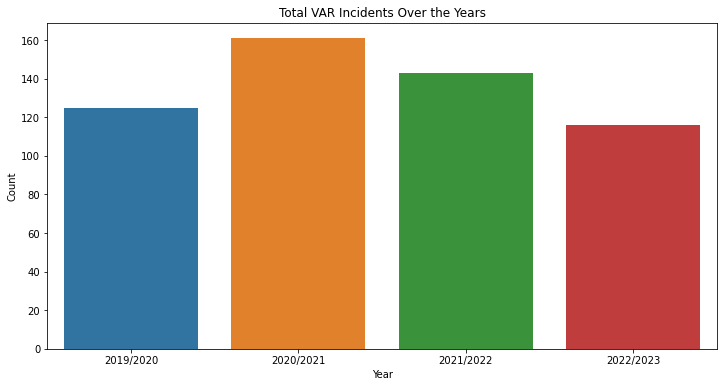

In [2]:
epl_var_final = pd.read_csv('epl_VAR_final_.csv')
# Count Plot: Total VAR Incidents Over the Years
plt.figure(figsize=(12, 6))
sns.countplot(x='Year', data=epl_var_final)
plt.title('Total VAR Incidents Over the Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

In [110]:
# Calculate mean for each variable grouped by 'Referee'
yellow_cards_mean = epl_var_final.groupby('Referee')['Total_Yellow_Cards_by_Referee'].mean().sort_values(ascending=False)
red_cards_mean = epl_var_final.groupby('Referee')['Total_Red_Cards_by_Referee'].mean().sort_values(ascending=False)
games_officiated_mean = epl_var_final.groupby('Referee')['Total_Games_Officiated_by_Referee'].mean().sort_values(ascending=False)

# Display the results
print("Average Yellow Cards by Referee:")
print(yellow_cards_mean)

print("\Average Red Cards by Referee:")
print(red_cards_mean)

print("\Average Games Officiated by Referee:")
print(games_officiated_mean)

Average Yellow Cards by Referee:
Referee
Anthony Taylor       518.0
Paul Tierney         461.0
Craig Pawson         447.0
Michael Oliver       440.0
Mike Dean            426.0
Stuart Attwell       396.0
Chris Kavanagh       333.0
David Coote          324.0
Jonathan Moss        318.0
Martin Atkinson      311.0
Kevin Friend         305.0
Andre Marriner       305.0
Peter Bankes         236.0
Simon Hooper         232.0
Andy Madley          207.0
Graham Scott         182.0
Robert Jones         165.0
Darren England       162.0
Lee Mason            143.0
John Brooks          103.0
Jarred Gillett        79.0
Michael Salisbury     79.0
Tony Harrington       30.0
Thomas Bramall        24.0
Robert Madley          6.0
Joshua Smith           NaN
Name: Total_Yellow_Cards_by_Referee, dtype: float64
\Average Red Cards by Referee:
Referee
Mike Dean            24.0
Michael Oliver       18.0
Anthony Taylor       18.0
Craig Pawson         15.0
Paul Tierney         14.0
Graham Scott         13.0
Jonathan M

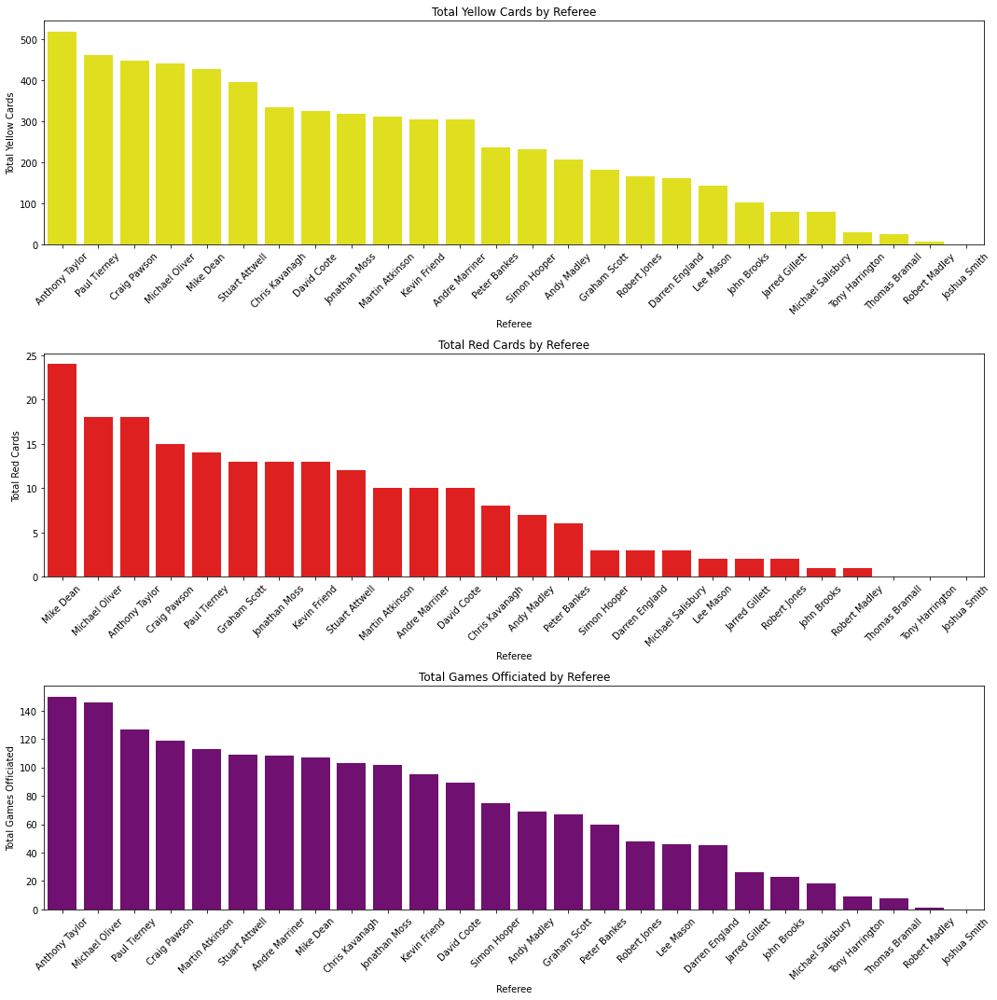

In [99]:
# Referee Statistics
f, axes = plt.subplots(3, 1, figsize=(15, 15))  # Change 1 to 4 to create a vertical layout
# Yellow Cards
sns.barplot(x=epl_var_final.groupby('Referee')['Total_Yellow_Cards_by_Referee'].mean().sort_values(ascending=False).index,
            y=epl_var_final.groupby('Referee')['Total_Yellow_Cards_by_Referee'].mean().sort_values(ascending=False),
            ax=axes[0], color='yellow')
axes[0].set_title('Total Yellow Cards by Referee')
axes[0].set_ylabel('Total Yellow Cards')
axes[0].tick_params(axis='x', rotation=45)

# Red Cards
sns.barplot(x=epl_var_final.groupby('Referee')['Total_Red_Cards_by_Referee'].mean().sort_values(ascending=False).index,
            y=epl_var_final.groupby('Referee')['Total_Red_Cards_by_Referee'].mean().sort_values(ascending=False),
            ax=axes[1], color='red')
axes[1].set_title('Total Red Cards by Referee')
axes[1].set_ylabel('Total Red Cards')
axes[1].tick_params(axis='x', rotation=45)

# Total Games Officiated
sns.barplot(x=epl_var_final.groupby('Referee')['Total_Games_Officiated_by_Referee'].mean().sort_values(ascending=False).index,
            y=epl_var_final.groupby('Referee')['Total_Games_Officiated_by_Referee'].mean().sort_values(ascending=False),
            ax=axes[2], color='purple')
axes[2].set_title('Total Games Officiated by Referee')
axes[2].set_xlabel('Referee')
axes[2].set_ylabel('Total Games Officiated')
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show() 

<Figure size 720x720 with 0 Axes>

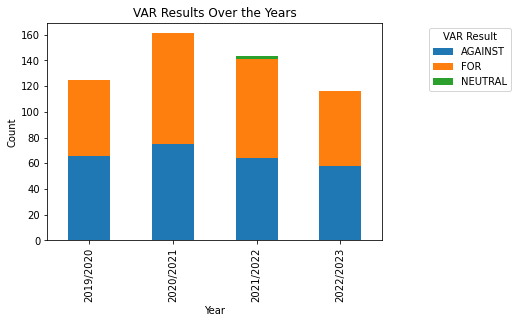

In [104]:
plt.figure(figsize=(10,10))
var_result_over_years = epl_var_final.groupby(['Year', 'VAR_Result']).size().unstack().plot(kind='bar', stacked=True)
plt.title('VAR Results Over the Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='VAR Result', loc='upper right', bbox_to_anchor=(1.4, 1))
plt.show()

# Building the Corpus

In [10]:
# Load the file
epl_var_final = pd.read_csv('epl_VAR_final_.csv')
epl_var_final.head()

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Score,Home_Team_Stadium,Top_Scorers,Goalkeepers,Notes_combined,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",No Notes Found,Andy Madley,West Yorkshire,207.0,7.0,69.0
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,0–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",No Notes Found,Martin Atkinson,West Yorkshire,311.0,10.0,113.0
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",No Notes Found,Peter Bankes,Lancashire,236.0,6.0,60.0
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,0–0,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",No Notes Found,Mike Dean,Wirral,426.0,24.0,107.0
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,0–1,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...,Mike Dean,Wirral,426.0,24.0,107.0


In [11]:
# Build the Corpus using all the Texts available in the epl_var_final dataset
epl_var_final['Match_Details_Corpus'] = (
    epl_var_final['Year'].astype(str) +
    ' ' +
    epl_var_final['Home_Team'].fillna('') +
    ' vs ' +
    epl_var_final['Away_Team'].fillna('') +
    ' - ' +
    epl_var_final['VAR_Description'].fillna('') +
    ' - ' +
    epl_var_final['Time_of_Incident'].fillna('') +
    ' - ' +
    #epl_var_final['VAR_Result'].fillna('') +
    #' - ' + 
    epl_var_final['Score'].fillna('') +
    ' - ' + 
    epl_var_final['Home_Team_Stadium'].fillna('') +
    ' - ' +
    epl_var_final['Top_Scorers'].fillna('') +
    ' - ' +
    epl_var_final['Goalkeepers'].fillna('') +
    ' - ' +
    epl_var_final['Notes_combined'].fillna('') +
    ' - ' +
    epl_var_final['Referee'].fillna('')
)
#display(epl_var_final)

In [ ]:
# Save this as a file
# epl_var_final.to_csv('epl_VAR_decisions_Corpus.csv',index = False)

# NLP Tasks

In [94]:
# Load the file
epl_var_final_2 = pd.read_csv('epl_VAR_decisions_Corpus.csv')
#epl_var_final_2 = pd.read_csv('epl_VAR_decisions_Cleaned_Corpus.csv')
epl_var_final_2

,Year,Home_Team,Away_Team,VAR_Description,Time_of_Incident,VAR_Result,Score,Home_Team_Stadium,Top_Scorers,Goalkeepers,Notes_combined,Referee,Referee_Origin,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee,Match_Details_Corpus
0,2019/2020,Brighton & Hove Albion,Aston Villa,Conor Hourihane goal ruled out for a foul by W...,42th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Jack...","[ Home Team: Mathew Ryan, Away Team: Tom Heaton]",No Notes Found,Andy Madley,West Yorkshire,207.0,7.0,69.0,2019/2020 Brighton & Hove Albion vs Aston Vill...
1,2019/2020,Brighton & Hove Albion,Arsenal,David Luiz goal disallowed for offside,63th minute,FOR,0–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Pier...","[ Home Team: Mathew Ryan, Away Team: Bernd Leno]",No Notes Found,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Brighton & Hove Albion vs Arsenal - ...
2,2019/2020,Brighton & Hove Albion,Sheffield United,Jack O'Connell goal disallowed for offside,54th minute,FOR,1–1,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Lys ...","[ Home Team: Mathew Ryan, Away Team: Dean Hend...",No Notes Found,Peter Bankes,Lancashire,236.0,6.0,60.0,2019/2020 Brighton & Hove Albion vs Sheffield ...
3,2019/2020,Brighton & Hove Albion,Burnley,Jay Rodriguez goal ruled out for offside again...,57th minute,FOR,0–0,The American Express Community Stadium,"[ Home Team: Neal Maupay - 10, Away Team: Chri...","[ Home Team: Mathew Ryan, Away Team: Nick Pope]",No Notes Found,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Brighton & Hove Albion vs Burnley - ...
4,2019/2020,Manchester United,Arsenal,"Pierre-Emerick Aubameyang goal, originally rul...",58th minute,AGAINST,0–1,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Bernd Leno]",[ Home Team: → Champions League via league fin...,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Manchester United vs Arsenal - Pierr...
5,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,0–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Chris Kavanagh,Lancashire,333.0,8.0,103.0,2019/2020 Manchester United vs Manchester City...
6,2019/2020,Manchester United,Manchester City,Penalty awarded (scored by Marcus Rashford) fo...,23th minute,FOR,2–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ederson]",[ Home Team: → Champions League via league fin...,Mike Dean,Wirral,426.0,24.0,107.0,2019/2020 Manchester United vs Manchester City...
7,2019/2020,Manchester United,Chelsea,Olivier Giroud goal disallowed for offside,77th minute,FOR,0–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Kepa Arr...",[ Home Team: → Champions League via league fin...,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Manchester United vs Chelsea - Olivi...
8,2019/2020,Manchester United,Watford,Goal for Troy Deeney disallowed for handball b...,52th minute,FOR,3–0,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Ben Foster]",[ Home Team: → Champions League via league fin...,Martin Atkinson,West Yorkshire,311.0,10.0,113.0,2019/2020 Manchester United vs Watford - Goal ...
9,2019/2020,Manchester United,Tottenham Hotspur,Penalty awarded for a foul on Bruno Fernandes ...,91th minute,AGAINST,1–6,Old Trafford,"[ Home Team: Anthony Martial, Marcus Rashford ...","[ Home Team: David de Gea, Away Team: Hugo Llo...",[ Home Team: → Champions League via league fin...,Anthony Taylor,Cheshire,518.0,18.0,150.0,2019/2020 Manchester United vs Tottenham Hotsp...


In [95]:
epl_var_final_2.columns

Index(['Year', 'Home_Team', 'Away_Team', 'VAR_Description', 'Time_of_Incident',
       'VAR_Result', 'Score', 'Home_Team_Stadium', 'Top_Scorers',
       'Goalkeepers', 'Notes_combined', 'Referee', 'Referee_Origin',
       'Total_Yellow_Cards_by_Referee', 'Total_Red_Cards_by_Referee',
       'Total_Games_Officiated_by_Referee', 'Match_Details_Corpus'],
      dtype='object')

In [98]:
descriptive_stats = epl_var_final_2.describe()
display(descriptive_stats)

,Total_Yellow_Cards_by_Referee,Total_Red_Cards_by_Referee,Total_Games_Officiated_by_Referee
count,544.000000,544.000000,544.000000
mean,331.020221,11.292279,98.452206
std,125.165296,6.039545,35.881141
min,6.000000,0.000000,1.000000
25%,232.000000,7.000000,69.000000
50%,324.000000,10.000000,107.000000
75%,440.000000,15.000000,119.000000
max,518.000000,24.000000,150.000000


----------------------------------------------------------------------------------

## Data Preparation for Sentiment Analysis

In [56]:
# Load the file
epl_var_final_2 = pd.read_csv('epl_VAR_decisions_Corpus.csv')
# Read only Relevant Columns
epl_var_final_2 = epl_var_final_2[["VAR_Result","Match_Details_Corpus"]]
epl_var_final_2.head()

,VAR_Result,Match_Details_Corpus
0,FOR,2019/2020 Brighton & Hove Albion vs Aston Vill...
1,FOR,2019/2020 Brighton & Hove Albion vs Arsenal - ...
2,FOR,2019/2020 Brighton & Hove Albion vs Sheffield ...
3,FOR,2019/2020 Brighton & Hove Albion vs Burnley - ...
4,AGAINST,2019/2020 Manchester United vs Arsenal - Pierr...


In [57]:
epl_var_final_2.columns

Index(['VAR_Result', 'Match_Details_Corpus'], dtype='object')

In [58]:
len(epl_var_final_2)

545

In [59]:
epl_var_final_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 545 entries, 0 to 544
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   VAR_Result            545 non-null    object
 1   Match_Details_Corpus  545 non-null    object
dtypes: object(2)
memory usage: 8.6+ KB


In [60]:
epl_var_final_2['VAR_Result'].value_counts()

FOR        280
AGAINST    263
NEUTRAL      2
Name: VAR_Result, dtype: int64

In [61]:
# Convert VAR_Result to categorial
epl_var_final_2['VAR_Result'] = epl_var_final_2['VAR_Result'].astype('category')
print(epl_var_final_2['VAR_Result'].value_counts())

FOR        280
AGAINST    263
NEUTRAL      2
Name: VAR_Result, dtype: int64


In [62]:
# Print the Neutral Instances
neutral_instances = epl_var_final_2[epl_var_final_2['VAR_Result'] == 'NEUTRAL']
print(neutral_instances['Match_Details_Corpus'][312])

2021/2022 Brentford vs Wolves - Ivan Toney goal which was originally ruled out for offside, was shown to be onside on review, but eventually ruled out on review for handball by the goal scorer - 29th minute - 1–1 - Brentford Community Stadium - [ Home Team: Ivan Toney - 12, Away Team: Raúl Jiménez - 6] - [ Home Team: David Raya, Away Team: José Sá] - No Notes Found - Robert Madley


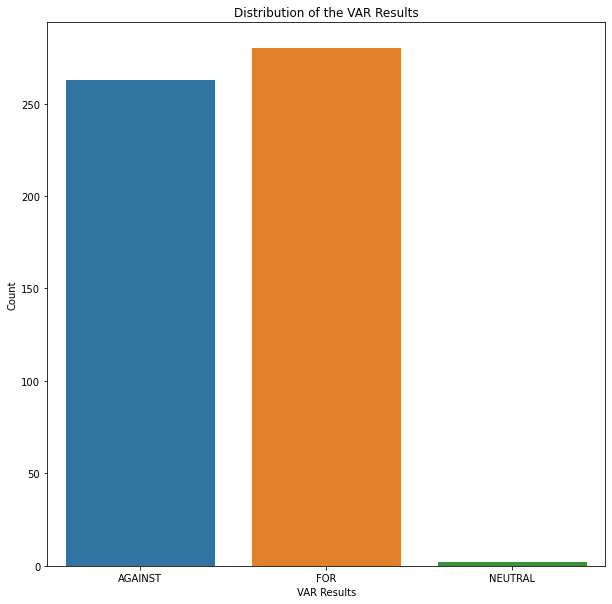

In [63]:
# Bar Plot for the Target Variable
plt.figure(figsize=(10,10))
sns.countplot(x= epl_var_final_2['VAR_Result'])
plt.title('Distribution of the VAR Results')
plt.xlabel('VAR Results')
plt.ylabel('Count')
plt.show()

## Feature Extraction

In [64]:
# Create a new DataFrame 
var_analysis = pd.DataFrame()

var_analysis[["VAR_Result","Match_Details_Corpus"]] = epl_var_final_2[["VAR_Result","Match_Details_Corpus"]]
var_analysis['length'] = epl_var_final_2['Match_Details_Corpus'].apply(len)  # Length of each VAR Description

# Function to calculate average word length in each document
def average_word_length(document):
    words = document.split()
    words_length = [len(word) for word in words]
    avg_word_length = sum(words_length)/len(words)
    return len(words)

var_analysis['Average_Word_Length'] = var_analysis['Match_Details_Corpus'].apply(lambda text: average_word_length(text)) 
var_analysis

,VAR_Result,Match_Details_Corpus,length,Average_Word_Length
0,FOR,2019/2020 Brighton & Hove Albion vs Aston Vill...,319,64
1,FOR,2019/2020 Brighton & Hove Albion vs Arsenal - ...,307,56
2,FOR,2019/2020 Brighton & Hove Albion vs Sheffield ...,323,59
3,FOR,2019/2020 Brighton & Hove Albion vs Burnley - ...,319,61
4,AGAINST,2019/2020 Manchester United vs Arsenal - Pierr...,418,74
5,FOR,2019/2020 Manchester United vs Manchester City...,421,75
6,FOR,2019/2020 Manchester United vs Manchester City...,416,75
7,FOR,2019/2020 Manchester United vs Chelsea - Olivi...,382,68
8,FOR,2019/2020 Manchester United vs Watford - Goal ...,364,67
9,AGAINST,2019/2020 Manchester United vs Tottenham Hotsp...,395,73


In [65]:
var_analysis.describe()

,length,Average_Word_Length
count,545.000000,545.000000
mean,321.411009,59.899083
std,40.364286,6.778460
min,248.000000,48.000000
25%,292.000000,55.000000
50%,311.000000,58.000000
75%,345.000000,64.000000
max,438.000000,80.000000


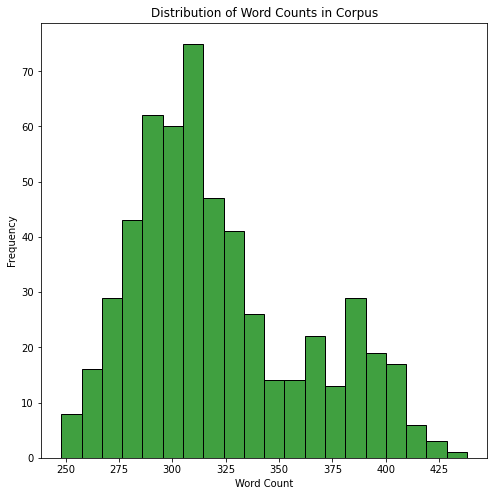

In [66]:
# Plot the Distribution of the Length of Words in the Corpus
plt.figure(figsize=(8,8))
sns.histplot(var_analysis['length'], bins=20, color='green')
plt.title('Distribution of Word Counts in Corpus')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

## Text Pre-processing for the Corpus

In [67]:
## Text Pre-processing Part 2
def text_preprocessing(uncleaned_text_corpus):
    corpus = []
    lemmatizer = WordNetLemmatizer()
    all_stopwords = set(stopwords.words('english'))

    # Additional terms to exclude
    exclude_terms = ['home', 'team', 'away', 'vs', 'th', 'no','minute', 'note', 'notes', 'found']

    for text in uncleaned_text_corpus:
        text = text.lower()  # Lower Casing: Convert everything to lower case
        text = re.sub(r"<.*?>", "", text)  # Remove all HTML Tags
        text = re.sub(r"[^a-zA-Z]", ' ', text)  # Combine multiple re.sub into a single expression
        text = re.sub(r'[&,\(\)\[\],/]', '', text) # Remove brackets and specific characters
        words = word_tokenize(text)  # Tokenize the text into words 
        words = [word for word in words if not word.isdigit()] # Remove numeric values

        # Apply lemmatization and exclude specific terms
        words = [lemmatizer.lemmatize(word) for word in words if word.lower() not in all_stopwords and word.lower() not in exclude_terms]

        # Join the processed words back into a string
        text = ' '.join(words)
        corpus.append(text)

    return corpus

In [68]:
# Apply the Text-Preprocessing to the Corpus
cleaned_corpus = text_preprocessing(var_analysis['Match_Details_Corpus'])
print(cleaned_corpus)

['brighton hove albion aston villa conor hourihane goal ruled foul wesley mat ryan american express community stadium neal maupay jack grealish mathew ryan tom heaton andy madley', 'brighton hove albion arsenal david luiz goal disallowed offside american express community stadium neal maupay pierre emerick aubameyang mathew ryan bernd leno martin atkinson', 'brighton hove albion sheffield united jack connell goal disallowed offside american express community stadium neal maupay lys mousset oliver mcburnie mathew ryan dean henderson peter bankes', 'brighton hove albion burnley jay rodriguez goal ruled offside johann berg gudmundsson american express community stadium neal maupay chris wood mathew ryan nick pope mike dean', 'manchester united arsenal pierre emerick aubameyang goal originally ruled offside overturned review old trafford anthony martial marcus rashford pierre emerick aubameyang david de gea bernd leno champion league via league finish europa league via cup win mike dean', 

# Top 30 words & Word Cloud

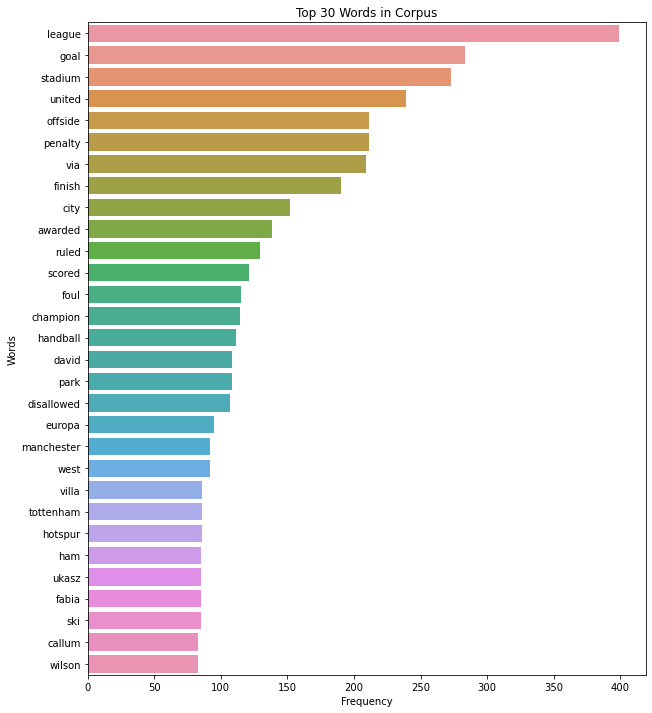

In [123]:
# Top 30 - Words in the Corpus
# Tokenize the cleaned corpus
tokenized_corpus = [word_tokenize(text) for text in cleaned_corpus]

# Flatten the list of lists into a single list of words
words = [word for sublist in tokenized_corpus for word in sublist if not word.isnumeric()]

# Calculate word frequencies
freq_dist = FreqDist(words)

# Get the top 30 words
top_words = freq_dist.most_common(30)
df_top_words = pd.DataFrame(top_words, columns=['Word', 'Frequency'])

# Create a horizontal bar plot with Seaborn
plt.figure(figsize=(10, 12))
sns.barplot(x='Frequency', y='Word', data=df_top_words)
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.title('Top 30 Words in Corpus')
plt.show()

In [122]:
print(freq_dist.most_common(3)) # Top 3 words

[('league', 399), ('goal', 283), ('stadium', 273)]


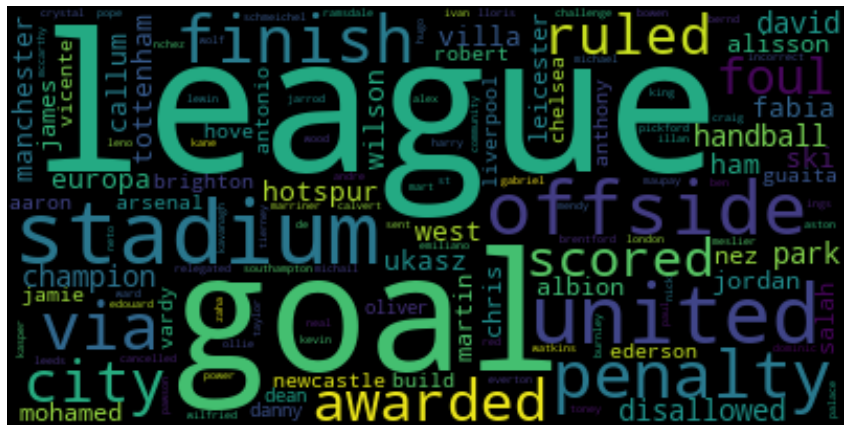

In [73]:
# Word Cloud

# Convert the list of tuples to a dictionary
top_words = freq_dist.most_common()
top_words_dict = dict(top_words)

# Build Word Cloud
wordcloud = WordCloud(background_color='black').generate_from_frequencies(top_words_dict)

# Display the Word Cloud
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# Vectorization of Text

### Hyper-parameter tuning for TF-IDF Vectorizer

In [75]:
# Hyperparameter Tuning for the TF-IDF Vectorizer
X = cleaned_corpus
y = var_analysis['VAR_Result']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=99)

# Create a pipeline with TfidfVectorizer and RandomForestClassifier
pipeline = Pipeline([
    ('tfidfvectorizer', TfidfVectorizer()),
    ('classifier', RandomForestClassifier())
])

# Set up parameter grid for GridSearchCV
param_grid = {
    'tfidfvectorizer__max_features': [200,400,600, 800],
    'tfidfvectorizer__min_df': [0.1, 0.3, 0.6],
    'tfidfvectorizer__max_df': [0.5, 0.7, 0.9],
    'classifier__n_estimators': [50, 100, 150],
    'classifier__max_depth': [None, 10, 20]
}

# Set up GridSearchCV with StratifiedKFold
grid_search = GridSearchCV(
    pipeline, param_grid, cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=99), scoring='accuracy', verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search.best_params_)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 440 tasks      | elapsed:   24.0s
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 1460 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1620 out of 1620 | elapsed:  1.8min finished


Best parameters found:  {'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'tfidfvectorizer__max_df': 0.9, 'tfidfvectorizer__max_features': 800, 'tfidfvectorizer__min_df': 0.1}


In [76]:
print("Best parameters found: \n", grid_search.best_params_)

Best parameters found: 
 {'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'tfidfvectorizer__max_df': 0.9, 'tfidfvectorizer__max_features': 800, 'tfidfvectorizer__min_df': 0.1}


In [77]:
# Now build the model by appling the best hyperparameters on the TF-IDF Vectorizer

# TF-IDF Transformer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features = 800, min_df=0.1, max_df=0.9)
tfidf_X = tfidf_vectorizer.fit_transform(cleaned_corpus)
print("\n TF-IDF shape: {}".format(tfidf_X.shape))

tfidf_corpus = pd.DataFrame(tfidf_X.toarray())
tfidf_corpus.head()


 TF-IDF shape: (545, 63)


,0,1,2,3,4,5,6,7,8,9,...,53,54,55,56,57,58,59,60,61,62
0,0.0,0.445658,0.0,0.000000,0.000000,0.0,0.459011,0.0,0.0,0.000000,...,0.0,0.0,0.244213,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.0,0.361895,0.0,0.000000,0.374646,0.0,0.372737,0.0,0.0,0.000000,...,0.0,0.0,0.198312,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.397183,0.0,0.000000,0.000000,0.0,0.409083,0.0,0.0,0.000000,...,0.0,0.0,0.217649,0.0,0.0,0.248888,0.0,0.0,0.0,0.0
3,0.0,0.329920,0.0,0.000000,0.000000,0.0,0.339805,0.0,0.0,0.000000,...,0.0,0.0,0.180790,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.271884,0.270483,0.0,0.000000,0.0,0.0,0.241376,...,0.0,0.0,0.000000,0.0,0.0,0.163725,0.0,0.0,0.0,0.0


In [78]:
# Create a New Data frame and add the TF-IDF vectors with all features
var_analysis_2 = pd.concat([tfidf_corpus, var_analysis[['Match_Details_Corpus','length','Average_Word_Length','VAR_Result']]],axis = 1)
var_analysis_2.head()

,0,1,2,3,4,5,6,7,8,9,...,57,58,59,60,61,62,Match_Details_Corpus,length,Average_Word_Length,VAR_Result
0,0.0,0.445658,0.0,0.000000,0.000000,0.0,0.459011,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,2019/2020 Brighton & Hove Albion vs Aston Vill...,319,64,FOR
1,0.0,0.361895,0.0,0.000000,0.374646,0.0,0.372737,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,2019/2020 Brighton & Hove Albion vs Arsenal - ...,307,56,FOR
2,0.0,0.397183,0.0,0.000000,0.000000,0.0,0.409083,0.0,0.0,0.000000,...,0.0,0.248888,0.0,0.0,0.0,0.0,2019/2020 Brighton & Hove Albion vs Sheffield ...,323,59,FOR
3,0.0,0.329920,0.0,0.000000,0.000000,0.0,0.339805,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,2019/2020 Brighton & Hove Albion vs Burnley - ...,319,61,FOR
4,0.0,0.000000,0.0,0.271884,0.270483,0.0,0.000000,0.0,0.0,0.241376,...,0.0,0.163725,0.0,0.0,0.0,0.0,2019/2020 Manchester United vs Arsenal - Pierr...,418,74,AGAINST


----------------------------------

# Data Partioning

In [79]:
# Split the Data
X = var_analysis_2.drop(["Match_Details_Corpus",'VAR_Result'],axis = 1)
y = var_analysis_2['VAR_Result'].replace('NEUTRAL', 'FOR')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify= y, random_state=99)
print("X_train_Dimensions:", X_train.shape)
print("X_test_Dimensions:", X_test.shape)
print("y_train_Dimensions:", y_train.shape)
print("y_test_Dimensions", y_test.shape)

X_train_Dimensions: (408, 65)
X_test_Dimensions: (137, 65)
y_train_Dimensions: (408,)
y_test_Dimensions (137,)


In [80]:
y.values

['FOR', 'FOR', 'FOR', 'FOR', 'AGAINST', ..., 'AGAINST', 'AGAINST', 'FOR', 'FOR', 'AGAINST']
Length: 545
Categories (2, object): ['AGAINST', 'FOR']

# ML Models
- ### Building the model on the Training Data and Making Predictions on the Test Data

### Building Pipelines on individual classifiers

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify= y, random_state=99)

# Logistic Regression Classifier
print(" ----------------------------------------------------------Pipeline for Logistic Regression ------------------------------------------------------------------------")
# Create a pipeline with TfidfVectorizer and Logistic Regression
pipeline_logistic = make_pipeline(LogisticRegression()
)
# Set up parameter grid for GridSearchCV
param_grid_logistic = {'logisticregression__C': [0.1, 1, 5],}

# Set up GridSearchCV with StratifiedKFold
grid_search_logistic = GridSearchCV(pipeline_logistic, param_grid_logistic, cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=99), verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search_logistic.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_logistic.best_params_)

# Get the best model
best_model_logistic = grid_search_logistic.best_estimator_
print(best_model_logistic)

# Cross-validated accuracy scores
cv_scores_logistic = cross_val_score(best_model_logistic, X_train, y_train, cv=10, scoring='accuracy')
print("Cross-validated Accuracy Scores:", cv_scores_logistic)
print("Mean Accuracy:", np.mean(cv_scores_logistic))

# Predict the labels on the test data
y_pred_logistic = best_model_logistic.predict(X_test)

# Print the classification report of the best classifier
print("Classification Report:")
print(classification_report(y_test, y_pred_logistic))

print(" ----------------------------------------------------------Pipeline for Random Forest Classifier ------------------------------------------------------------------------")

# # Create a pipeline for Random Forest Classifier
pipeline_rf = make_pipeline( RandomForestClassifier())

# Set up parameter grid for GridSearchCV
param_grid_rf = {
    'randomforestclassifier__n_estimators': [100, 150, 200,250],
    'randomforestclassifier__max_depth': [10, 20, 30,50],
}

# Set up GridSearchCV with StratifiedKFold
grid_search_rf = GridSearchCV( pipeline_rf, param_grid_rf, cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=99), verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search_rf.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_rf.best_params_)

# Get the best model
best_model_rf = grid_search_rf.best_estimator_
print(best_model_rf)

# Cross-validated accuracy scores
cv_scores_rf = cross_val_score(best_model_rf, X_train, y_train, cv=10, scoring='accuracy')
print("Cross-validated Accuracy Scores:", cv_scores_rf)
print("Mean Accuracy:", np.mean(cv_scores_rf))

# Predict the labels on the test data
y_pred_rf = best_model_rf.predict(X_test)

# Print the classification report of the best classifier
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))

print(" ----------------------------------------------------------Pipeline for Support Vector Classifier ------------------------------------------------------------------------")

# Support Vector Classifier
# # Create a pipeline for  Support Vector Classifier
pipeline_svc = make_pipeline(SVC(probability=True))

# Set up parameter grid for GridSearchCV
param_grid_svc = {'svc__C': [0.1, 1, 2],}

# Set up GridSearchCV with StratifiedKFold
grid_search_svc = GridSearchCV(pipeline_svc, param_grid_svc, cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=99), verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search_svc.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_svc.best_params_)

# Get the best model
best_model_svc = grid_search_svc.best_estimator_
print(best_model_svc)

# Cross-validated accuracy scores
cv_scores_svc = cross_val_score(best_model_svc, X_train, y_train, cv=10, scoring='accuracy')
print("Cross-validated Accuracy Scores:", cv_scores_svc)
print("Mean Accuracy:", np.mean(cv_scores_svc))

# Predict the labels on the test data
y_pred_svc = best_model_svc.predict(X_test)

# Print the classification report of the best classifier
print("Classification Report:")
print(classification_report(y_test, y_pred_svc))

print(" ----------------------------------------------------------Pipeline for XGB Classifier ------------------------------------------------------------------------")

# XGBoost Classifier
# Create a pipeline with TfidfVectorizer and XGBoost Classifier
pipeline_xgb = make_pipeline(XGBClassifier())

# Set up parameter grid for GridSearchCV
param_grid_xgb = {
    'xgbclassifier__n_estimators': [100, 150, 200,250],
    'xgbclassifier__max_depth': [5, 10, 20],
}

# Set up GridSearchCV with StratifiedKFold
grid_search_xgb = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=99), verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search_xgb.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_xgb.best_params_)

# Get the best model
best_model_xgb = grid_search_xgb.best_estimator_
print(best_model_xgb)

# Cross-validated accuracy scores
cv_scores_xgb = cross_val_score(best_model_xgb, X_train, y_train, cv=10, scoring='accuracy')
print("Cross-validated Accuracy Scores:", cv_scores_xgb)
print("Mean Accuracy:", np.mean(cv_scores_xgb))

# Predict the labels on the test data
y_pred_xgb = best_model_xgb.predict(X_test)

# Print the classification report of the best classifier
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb))

 ----------------------------------------------------------Pipeline for Logistic Regression ------------------------------------------------------------------------
Fitting 10 folds for each of 3 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.3min finished


Best parameters found:  {'logisticregression__C': 1}
Pipeline(steps=[('logisticregression', LogisticRegression(C=1))])
Cross-validated Accuracy Scores: [0.51219512 0.46341463 0.43902439 0.36585366 0.43902439 0.51219512
 0.53658537 0.43902439 0.45       0.475     ]
Mean Accuracy: 0.46323170731707314
Classification Report:
              precision    recall  f1-score   support

     AGAINST       0.44      0.41      0.43        66
         FOR       0.49      0.52      0.50        71

    accuracy                           0.47       137
   macro avg       0.46      0.47      0.46       137
weighted avg       0.47      0.47      0.47       137

 ----------------------------------------------------------Pipeline for Random Forest Classifier ------------------------------------------------------------------------
Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   31.1s finished


Best parameters found:  {'randomforestclassifier__max_depth': 50, 'randomforestclassifier__n_estimators': 200}
Pipeline(steps=[('randomforestclassifier',
                 RandomForestClassifier(max_depth=50, n_estimators=200))])
Cross-validated Accuracy Scores: [0.51219512 0.46341463 0.56097561 0.48780488 0.56097561 0.48780488
 0.65853659 0.51219512 0.525      0.675     ]
Mean Accuracy: 0.5443902439024391
Classification Report:
              precision    recall  f1-score   support

     AGAINST       0.47      0.41      0.44        66
         FOR       0.51      0.56      0.53        71

    accuracy                           0.49       137
   macro avg       0.49      0.49      0.48       137
weighted avg       0.49      0.49      0.49       137

 ----------------------------------------------------------Pipeline for Support Vector Classifier ------------------------------------------------------------------------
Fitting 10 folds for each of 3 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    0.7s finished


Best parameters found:  {'svc__C': 0.1}
Pipeline(steps=[('svc', SVC(C=0.1, probability=True))])
Cross-validated Accuracy Scores: [0.53658537 0.51219512 0.51219512 0.51219512 0.51219512 0.51219512
 0.51219512 0.51219512 0.525      0.525     ]
Mean Accuracy: 0.5171951219512196
Classification Report:
              precision    recall  f1-score   support

     AGAINST       0.00      0.00      0.00        66
         FOR       0.52      1.00      0.68        71

    accuracy                           0.52       137
   macro avg       0.26      0.50      0.34       137
weighted avg       0.27      0.52      0.35       137

 ----------------------------------------------------------Pipeline for XGB Classifier ------------------------------------------------------------------------
Fitting 10 folds for each of 12 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   24.6s finished


[18:03:19] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best parameters found:  {'xgbclassifier__max_depth': 20, 'xgbclassifier__n_estimators': 100}
Pipeline(steps=[('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='',
                               learning_rate=0.300000012, max_delta_step=0,
                               max_depth=20, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=4, num_parallel_tree=1, random_

## Running all the models as an Ensemble

In [86]:
# Create a pipeline with TfidfVectorizer and VotingClassifier with XGBClassifier
ensemble_pipeline = make_pipeline(
    # TfidfVectorizer(stop_words='english'),
    VotingClassifier(estimators=[
        ('randomforestclassifier', RandomForestClassifier()),
        ('xgbclassifier', XGBClassifier()),  
        ('logisticregression', LogisticRegression()),
        ('svm', SVC(probability=True)),
    ], voting='soft', weights=[1, 1, 1,1])  
)

# Set up parameter grid for GridSearchCV
param_grid_ensemble = { 
    'votingclassifier__randomforestclassifier__n_estimators': [100, 150, 200,250],
    'votingclassifier__randomforestclassifier__max_depth': [10, 20, 30,50],
    'votingclassifier__xgbclassifier__n_estimators': [100, 150, 200,250],  
    'votingclassifier__xgbclassifier__max_depth': [5, 10, 20],
    'votingclassifier__logisticregression__C': [0.1, 1, 5],
    'votingclassifier__svm__C': [0.1, 1, 2],
}

# Set up GridSearchCV with StratifiedKFold
grid_search_ensemble = GridSearchCV(
    ensemble_pipeline, param_grid_ensemble, cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=99), verbose=True, n_jobs=-1)

# Fit the model using GridSearchCV on the training data
grid_search_ensemble.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_ensemble.best_params_)

# Get the best model
best_model_ensemble = grid_search_ensemble.best_estimator_

# Cross-validated accuracy scores
cv_scores_ensemble = cross_val_score(best_model_ensemble, X_train, y_train, cv=10, scoring='accuracy')
print("Cross-validated Accuracy Scores:", cv_scores_ensemble)
print("Mean Accuracy:", np.mean(cv_scores_ensemble))

# Predict the labels on the test data
y_pred_ensemble = best_model_ensemble.predict(X_test)

# Print the classification report of the best classifier
print("Classification Report:")
print(classification_report(y_test, y_pred_ensemble))


Fitting 10 folds for each of 2304 candidates, totalling 23040 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   59.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 23.0min
[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed: 28.3min
[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed: 33.5min
[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 39.4min
[Parallel(n_jobs=-1)]: Done 9792 tasks      | elapsed: 46.2min
[Parallel(n_jobs=-1)]: Done 11242 tasks      |

[02:02:01] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best parameters found:  {'votingclassifier__logisticregression__C': 1, 'votingclassifier__randomforestclassifier__max_depth': 10, 'votingclassifier__randomforestclassifier__n_estimators': 150, 'votingclassifier__svm__C': 0.1, 'votingclassifier__xgbclassifier__max_depth': 5, 'votingclassifier__xgbclassifier__n_estimators': 150}
[02:02:03] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:02:03] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error'

In [94]:
# Print the classification report of the best classifier
print("Classification Report for the Best Model:")
print(classification_report(y_test, y_pred_ensemble))

Classification Report for the Best Model:
              precision    recall  f1-score   support

     AGAINST       0.55      0.52      0.53        66
         FOR       0.57      0.61      0.59        71

    accuracy                           0.56       137
   macro avg       0.56      0.56      0.56       137
weighted avg       0.56      0.56      0.56       137



In [98]:
print(grid_search_ensemble.best_estimator_)

Pipeline(steps=[('votingclassifier',
                 VotingClassifier(estimators=[('randomforestclassifier',
                                               RandomForestClassifier(max_depth=10,
                                                                      n_estimators=150)),
                                              ('xgbclassifier',
                                               XGBClassifier(base_score=None,
                                                             booster=None,
                                                             colsample_bylevel=None,
                                                             colsample_bynode=None,
                                                             colsample_bytree=None,
                                                             gamma=None,
                                                             gpu_id=None,
                                                             importance_type='gain',
              

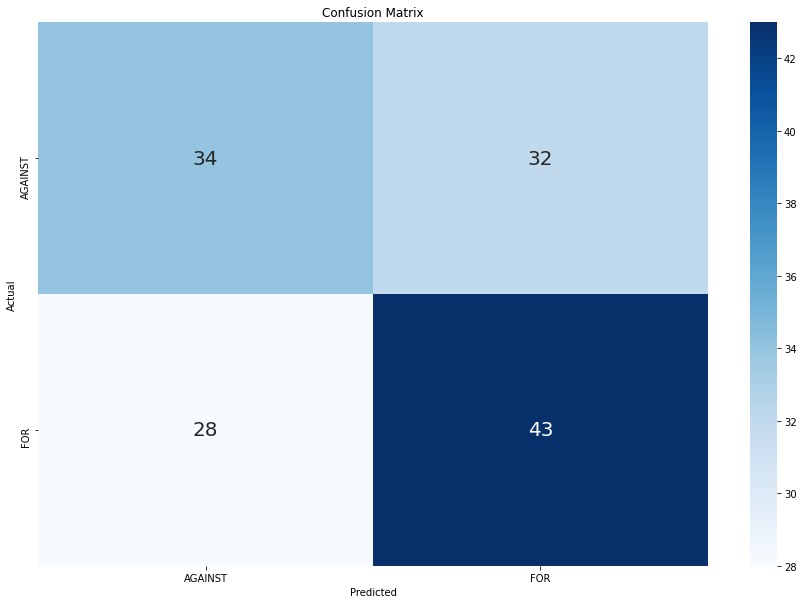

In [106]:
# Confusion matrix using a Heat Map

# Predict the labels on the test data
y_pred_ensemble = best_model_ensemble.predict(X_test)

# Get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_ensemble)

# Plot the heatmap
plt.figure(figsize=(15, 10))
annot_kws = {"ha": 'center', "va": 'center', 'fontsize': 20}  
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['AGAINST', 'FOR'], yticklabels=['AGAINST', 'FOR'], annot_kws=annot_kws)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

---------------------------------------------